# Présentation du notebook
-----------------

## Les nouveautés
Je vais présenter dans ce notebook la seconde phase de modélisation qui introduit deux nouveautés:
- Une nouvelle architecture de modèle de segmentation, **Feature Pyramid Network (FPN)**, qui repose encore sur une structure Encoder-Decoder, à l'instar d'U-Net.
- L'utilisation de **modèles pré-entrainés** pour initialiser les poids de l'encoder et réaliser **un transfert d'apprentissage**.

## La librairie Segmentation Models
Je vais utiliser également la librairie Python, **Segmentation Models**, compatible avec Tensorflow et Keras, dont les principales caractéristiques sont:
- High-level API pour la construction de modèles de segmentation
- 4 architectures de modèles de segmentation disponibles (U-Net, LinkNet, FPN et PSPNet)
- 25 backbones disponibles (ResNet, VGG, Inception, etc.) avec des poids pré-entrainés

La version compatible Tensorflow et Keras nécessite de downgrader la version de Tensorflow et Numpy par rapport au notebook précédent.<br>

Pour consulter la liste des modèles de segmentation et des encoders disponible, merci de consulter la documentation à ce lien :<br>
https://segmentation-models.readthedocs.io/en/latest/

# 1. Imports

In [5]:
# Standard library imports
import os
import math
import pathlib
import time
import pickle
from functools import cached_property
from typing import List, Tuple, Union, NamedTuple, Dict, Any

# Third-party library imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import tensorflow as tf
from tensorflow.keras.callbacks import History
import albumentations as A
import segmentation_models as sm
from sklearn.model_selection import train_test_split

# Local imports
from utils_and_constants import labels, TARGET_SIZE, COL_ORDER, show_nums_axes

# Environment configuration
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ["NO_ALBUMENTATIONS_UPDATES"] = "1"

# Set random seeds for reproducibility
np.random.seed(314)
tf.random.set_seed(314)

print("Number of CPU cores available: ", NUM_WORKERS := os.cpu_count())

Number of CPU cores available:  16


# 2. DataLoader, Metrics and Loss Functions
-------------------

## Le DataLoader
Modification de la classe ImageSegmentationDataset dont :
- Mise à niveau pour la rendre compatible avec la version downgradée de Tensorflow et Keras.
- Intégration des fonctions de prétraitement de la librairie Segmentation Models dans la classe ImageSegmentationDataset.

In [6]:
# Define the Data Generator Class
class ImageSegmentationDataset(tf.keras.utils.Sequence):
    """Dataset generator for image segmentation tasks.

    This class extends tf.keras.utils.Sequence to provide data loading,
    augmentation, and preprocessing for images and their corresponding
    segmentation masks.
    """

    def __init__(
        self,
        paths: List[Tuple[pathlib.Path, pathlib.Path]],
        labels: NamedTuple,
        batch_size: int,
        target_size: Tuple[int, int],
        augmentations: bool = False,
        preview: int = None,
        normalize: bool | str = True,
        shuffle: bool = True,
        label_onehot: bool = False,
        sample_weights: List[float] = None,
        **kwargs,
    ) -> None:
        """Initializes the dataset with image and mask paths and configuration."""
        super().__init__()
        self.image_paths, self.mask_paths = self.load_img_and_mask_paths(paths, preview)

        self.table_id2category = {label.id: label.categoryId for label in labels}
        self.table_category2name = {
            label.categoryId: label.category for label in labels
        }

        self.batch_size = batch_size
        self.target_size = target_size
        self.augmentations = augmentations
        self.normalize = normalize
        self.shuffle = shuffle
        self.label_onehot = label_onehot
        self.sample_weights = sample_weights

        if self.augmentations:
            self.compose = A.Compose(
                [
                    A.HorizontalFlip(p=0.5),
                    A.OneOf(
                        [
                            A.RandomBrightnessContrast(
                                brightness_limit=0.2, contrast_limit=0.2, p=1.0
                            ),
                            A.HueSaturationValue(
                                hue_shift_limit=10,
                                sat_shift_limit=15,
                                val_shift_limit=10,
                                p=1.0,
                            ),
                        ],
                        p=0.5,
                    ),
                    A.OneOf(
                        [
                            A.GaussianBlur(blur_limit=3, p=1.0),
                            A.MotionBlur(blur_limit=5, p=1.0),
                            A.OpticalDistortion(distort_limit=0.05, p=1.0),
                        ],
                        p=0.25,
                    ),
                ],
                additional_targets={"sample_weights": "mask"}
                if self.sample_weights is not None
                else {},
            )

        if self.shuffle:
            self.on_epoch_end()

    @cached_property
    def num_classes(self) -> int:
        """Returns the number of unique classes in the dataset."""
        return len(set(self.table_id2category.values()))

    @cached_property
    def num_samples(self) -> int:
        """Returns the total number of samples in the dataset."""
        return len(self.image_paths)

    @staticmethod
    def load_img_and_mask_paths(
        paths: List[Tuple[pathlib.Path, pathlib.Path]], preview: int
    ) -> Tuple[List[pathlib.Path], List[pathlib.Path]]:
        """Unpacks image and mask paths and applies preview slicing if specified."""
        image_paths, mask_paths = zip(*paths)
        if len(image_paths) != len(mask_paths):
            raise ValueError("Number of images and masks must be equal.")
        if preview is not None:
            image_paths = image_paths[:preview]
            mask_paths = mask_paths[:preview]
        return list(image_paths), list(mask_paths)

    def __len__(self) -> int:
        """Calculates the number of batches per epoch."""
        return math.ceil(self.num_samples / self.batch_size)

    def __getitem__(
        self, index: int
    ) -> Union[
        Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]
    ]:
        """Fetches a batch of images and masks."""
        start_idx = index * self.batch_size
        end_idx = min(start_idx + self.batch_size, self.num_samples)
        if start_idx >= self.num_samples:
            raise IndexError("Index out of range")

        batch_paths = list(
            zip(self.image_paths[start_idx:end_idx], self.mask_paths[start_idx:end_idx])
        )
        results = [self.load_and_augment(pair) for pair in batch_paths]

        if self.sample_weights is not None:
            images, masks, weights = zip(*results)
            return np.asarray(images), np.asarray(masks), np.asarray(weights)
        else:
            images, masks = zip(*results)
            return np.asarray(images), np.asarray(masks)

    def on_epoch_end(self) -> None:
        """Shuffles the dataset at the end of each epoch if shuffling is enabled."""
        if self.shuffle:
            zip_paths = list(zip(self.image_paths, self.mask_paths))
            np.random.shuffle(zip_paths)
            self.image_paths, self.mask_paths = zip(*zip_paths)

    def preprocess_img(self, img_array: np.ndarray) -> np.ndarray:
        """Preprocesses an image array based on the normalization setting."""
        if isinstance(self.normalize, bool):
            return img_array
        elif isinstance(self.normalize, str):
            try:
                preprocess_input = sm.get_preprocessing(self.normalize)
                return preprocess_input(img_array)
            except AttributeError as e:
                print(
                    f"Invalid normalization option: {self.normalize}. Should be True, False, or a valid backbone name."
                )
                raise e
        else:
            raise ValueError("Normalization option must be a boolean or a string.")

    def load_img_to_array(self, img_path: pathlib.Path) -> np.ndarray:
        """Loads an image, resizes it, and converts it to an array."""
        img = tf.keras.utils.load_img(
            str(img_path),
            target_size=self.target_size,
            color_mode="rgb",
            interpolation="bilinear",
        )
        img_array = tf.keras.utils.img_to_array(img, dtype=np.float32)
        return img_array / 255.0 if self.normalize else img_array

    def load_mask_to_array(self, mask_path: pathlib.Path) -> np.ndarray:
        """Loads a segmentation mask, resizes it, maps mask IDs to category IDs,
        and applies one-hot encoding if enabled.
        """
        mask = tf.keras.utils.load_img(
            str(mask_path),
            target_size=self.target_size,
            color_mode="grayscale",
            interpolation="nearest",
        )
        mask_array = tf.keras.utils.img_to_array(mask, dtype=np.int8)
        mask_array = np.vectorize(self.table_id2category.get)(mask_array).squeeze()
        if self.label_onehot:
            mask_array = tf.keras.utils.to_categorical(
                mask_array, num_classes=self.num_classes
            )
        return mask_array

    def load_and_augment(
        self, paths: Tuple[pathlib.Path, pathlib.Path]
    ) -> Union[
        Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]
    ]:
        """Loads and optionally augments an image and its mask (and sample weights if provided)."""
        img_path, mask_path = paths
        img = self.load_img_to_array(img_path)
        mask = self.load_mask_to_array(mask_path)

        if self.sample_weights is not None:
            weights = np.take(self.sample_weights, mask)
            if self.augmentations:
                augmented = self.compose(image=img, mask=mask, sample_weights=mask)
                return (
                    self.preprocess_img(augmented["image"]),
                    augmented["mask"],
                    augmented["sample_weights"],
                )
            else:
                return self.preprocess_img(img), mask, weights
        else:
            if self.augmentations:
                augmented = self.compose(image=img, mask=mask)
                return self.preprocess_img(augmented["image"]), augmented["mask"]
            else:
                return self.preprocess_img(img), mask

    def get_image_and_mask(
        self, index: int
    ) -> Tuple[np.ndarray, np.ndarray, Tuple[pathlib.Path, pathlib.Path]]:
        """Retrieves a single image/mask pair for visualization."""
        paths = (self.image_paths[index], self.mask_paths[index])
        if self.sample_weights is None:
            img, mask = self.load_and_augment(paths)
        else:
            img, mask, _ = self.load_and_augment(paths)
        return img, mask, paths

    def get_prediction(self, model, index: int) -> np.ndarray:
        """Generates a segmentation prediction using the provided model."""
        img, _, _ = self.get_image_and_mask(index)
        mask_pred = model.predict(np.expand_dims(img, axis=0))
        mask_pred = np.argmax(mask_pred.squeeze(), axis=-1)
        return mask_pred

    def show_transformation(self, index: int, figsize=(12, 8)) -> None:
        """Displays the original and transformed versions of an image and its mask."""
        img, mask, paths = self.get_image_and_mask(index)
        img_path, mask_path = paths

        if self.label_onehot:
            mask = np.argmax(mask, axis=-1)
        if isinstance(self.normalize, str):
            img = (img - img.min()) / (img.max() - img.min())

        fig, ax = plt.subplots(2, 2, figsize=figsize)
        fig.suptitle("Image and Mask before/after Transformation", fontsize=16)
        ax[0, 0].imshow(plt.imread(img_path))
        ax[0, 0].set_title("Original Image")
        ax[0, 1].imshow(img)
        ax[0, 1].set_title("Transformed Image")
        ax[1, 0].imshow(plt.imread(mask_path))
        ax[1, 0].set_title("Original Mask")
        ax[1, 1].imshow(mask)
        ax[1, 1].set_title("Transformed Mask")
        for a in ax.ravel():
            a.axis("off")
        plt.tight_layout()
        plt.show()

    def show_prediction(self, model, index: int, figname: str, figsize=(15, 6)) -> None:
        """Displays the original image, ground truth, and model prediction."""
        img, mask, paths = self.get_image_and_mask(index)
        img_path, _ = paths
        mask_pred = self.get_prediction(model, index)

        if self.label_onehot:
            mask = np.argmax(mask, axis=-1)
        if isinstance(self.normalize, str):
            img = (img + 1) / 2
            # img = (img - img.min()) / (img.max() - img.min())

        fig = plt.figure(layout="constrained", figsize=figsize)
        fig.suptitle(f"{figname} Predictions", fontsize=16)
        subfigs = fig.subfigures(2, 1, wspace=0.07)
        axsTop = subfigs[0].subplots(1, 3, sharey=True, sharex=True)
        axsBottom = subfigs[1].subplots(1, 3, sharey=True, sharex=True)

        for i, ax in enumerate(axsTop):
            if i == 0:
                ax.imshow(self.load_img_to_array(img_path))
                ax.set_title("Original Image")
            elif i == 1:
                ax.imshow(mask, cmap="Greys")
                ax.set_title("Ground Truth Mask (Grayscale)")
            else:
                ax.imshow(mask)
                ax.set_title("Ground Truth Mask (RGB)")
            ax.axis("off")

        for i, ax in enumerate(axsBottom):
            if i == 0:
                ax.imshow(self.load_img_to_array(img_path))
                ax.set_title("Original Image")
            elif i == 1:
                ax.imshow(mask_pred, cmap="Greys")
                ax.set_title("Predicted Mask (Grayscale)")
            else:
                ax.imshow(mask_pred)
                ax.set_title("Predicted Mask (RGB)")
            ax.axis("off")
        plt.show()


## Les métriques
- Utilisation des métriques de la librairie Segmentation Models (moyenne et par classe) pour évaluer la performance de nos modèles.
- Utilisation de notre classe métrique pour évaluer les performances de chaque modèle. (voir notebook précédent)
- Utilisation de notre classe métrique pour comparer les performances globales de tous les modèles. (voir notebook précédent)

In [7]:
# Define the main metrics
mean_metrics = [
    sm.metrics.IOUScore(
        name="MeanIoU",
        class_indexes=[*range(8)],
        class_weights=None,
        per_image=False,
        threshold=0.5,
    ),
    sm.metrics.FScore(
        name="Dice",
        class_indexes=[*range(8)],
        class_weights=None,
        per_image=False,
        beta=1,
        threshold=0.5,
    ),
    tf.keras.metrics.CategoricalAccuracy(name="Pixel_Accuracy"),
]

# Define per-class metrics
per_class_metrics = [
    sm.metrics.IOUScore(
        name=f"IoU_class_{i}",
        class_indexes=i,
        class_weights=None,
        per_image=False,
        threshold=0.5,
    )
    for i in range(8)
]

In [8]:
# Define the Metric class
class ModelMetric:
    """ModelMetric holds and processes training history metrics and evaluation results.

    Attributes:
        history_metrics (Dict[str, Any]): A dictionary of training and validation metrics.
        history_params (Dict[str, Any]): The parameters used during training.
        epochs_list (List[int]): List of epoch numbers.
        results (Dict[str, Any]): Test evaluation results.
        extra_metrics (Dict[str, Any]): Additional information and metrics.
        monitor (str): Metric to monitor, e.g. "loss".
        best_monitor (str): Indicator whether to maximize or minimize the monitor metric ('max' or 'min').
        model_name (str): Name of the model extracted from history.
    """

    def __init__(
        self,
        history: Any,
        results: Dict[str, Any],
        extra_metrics: Dict[str, Any],
        monitor: str,
        best_monitor: str,
    ) -> None:
        """Initialize ModelMetric instance.

        Args:
            history (Any): History object with attributes 'history', 'params', 'epoch', and model information.
            results (Dict[str, Any]): Dictionary containing the test results.
            extra_metrics (Dict[str, Any]): Dictionary of extra metrics and additional info.
            monitor (str): The metric key to monitor (e.g., "loss").
            best_monitor (str): String to indicate direction ('max' or 'min') for the monitor.
        """
        self.history_metrics: Dict[str, Any] = {
            (f"train_{k}" if not k.startswith("val") else k): v
            for k, v in history.history.items()
        }
        self.history_params: Dict[str, Any] = history.params
        self.epochs_list: List[int] = list(map(lambda x: x + 1, history.epoch))
        self.results: Dict[str, Any] = results
        self.extra_metrics: Dict[str, Any] = extra_metrics
        self.monitor: str = monitor
        self.best_monitor: str = best_monitor

        def get_model_name(history_obj: Any) -> str:
            """Extract the model name from the history object.

            Args:
                history_obj (Any): History object to extract the model name from.

            Returns:
                str: Model name.
            """
            if hasattr(history_obj, "model"):
                return history_obj.model.custom_name
            else:
                return history_obj._model.name

        self.model_name: str = get_model_name(history)

    @classmethod
    def from_pickle(cls, pickle_path: str) -> "ModelMetric":
        """Load a ModelMetric instance from a pickle file.

        Args:
            pickle_path (str): Path to the pickle file.

        Returns:
            ModelMetric: The loaded ModelMetric instance.
        """
        with open(pickle_path, "rb") as f:
            return pickle.load(f)

    @property
    def best_epoch(self) -> int:
        """Identify the best epoch based on the monitor.

        Returns:
            int: Index of the epoch with the best monitored metric.

        Raises:
            ValueError: If best_monitor is neither 'max' nor 'min'.
        """
        monitor_values = self.history_metrics[self.monitor]
        match self.best_monitor.lower().strip():
            case "max":
                return monitor_values.index(max(monitor_values))
            case "min":
                return monitor_values.index(min(monitor_values))
            case _:
                raise ValueError(
                    f"Unknown monitor: {self.monitor}. Must be 'max' or 'min'."
                )

    @cached_property
    def metrics_df(self) -> pd.DataFrame:
        """Create a DataFrame containing metrics for the best epoch and additional info.

        Returns:
            pd.DataFrame: Combined DataFrame of training, validation, and test metrics.
        """
        train_val_metrics = (
            pd.DataFrame(self.history_metrics)
            .iloc[self.best_epoch, :]
            .to_frame()
            .T.reset_index(drop=True)
        )
        test_metrics = pd.DataFrame(
            data=[list(self.results.values())],
            columns=[f"test_{k}" for k in self.results.keys()],
        )
        metrics_df = pd.concat([train_val_metrics, test_metrics], axis=1)
        metrics_df = metrics_df.assign(
            best_epoch=self.best_epoch,
            n_epochs=self.history_params.get("epochs"),
            n_steps=self.history_params.get("steps"),
            model_name=self.model_name,
        )
        metrics_df.insert(
            0, "experiment_folder", self.extra_metrics.get("experiment_folder")
        )
        for key, value in self.extra_metrics.items():
            if key != "experiment_folder":
                metrics_df[key] = value
        return metrics_df

    def save_metrics(
        self, metrics_path: str = "../metrics.csv", artifacts_path: str = "../artifacts"
    ) -> None:
        """Save metrics to CSV and serialize the ModelMetric instance as a pickle file.

        Args:
            metrics_path (str): Path to the CSV file where metrics are saved.
            artifacts_path (str): Directory path where artifacts are stored.
        """
        if not os.path.exists(metrics_path):
            self.metrics_df.to_csv(metrics_path, mode="a", header=True, index=False)
            print(f"Metrics file created at {metrics_path}")
        else:
            self.metrics_df[COL_ORDER].to_csv(
                metrics_path, mode="a", header=False, index=False
            )
            print(f"Metrics file updated at {metrics_path}")

        pickle_file_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "model_metric.pkl",
        )
        os.makedirs(os.path.dirname(pickle_file_path), exist_ok=True)
        with open(pickle_file_path, "wb") as f:
            pickle.dump(self, f)
            print(f"Pickle file created at {artifacts_path}")

    def plot_loss(
        self, figsize: tuple = (12, 6), artifacts_path: str = "../artifacts"
    ) -> None:
        """Plot and save the training and validation loss curve.

        Args:
            figsize (tuple): Figure size.
            artifacts_path (str): Directory path where the plot is saved.
        """
        fig_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "plot_loss.png",
        )
        fig = plt.figure(figsize=figsize)
        plt.plot(
            self.epochs_list,
            self.history_metrics["train_loss"],
            label="train_loss",
            color="blue",
        )
        plt.plot(
            self.epochs_list,
            self.history_metrics["val_loss"],
            label="val_loss",
            color="red",
        )
        plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.title(f"{self.model_name} Training and Validation Loss Curve per Epoch")
        plt.grid()
        plt.legend()
        plt.show()
        fig.savefig(fig_path)

    def plot_train_metrics(
        self, figsize: tuple = (20, 10), artifacts_path: str = "../artifacts"
    ) -> None:
        """Plot and save training metrics curves.

        Args:
            figsize (tuple): Figure size.
            artifacts_path (str): Directory path where the plot is saved.
        """
        fig_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "plot_train_metrics.png",
        )
        history_metrics_df = pd.DataFrame(self.history_metrics)
        history_metrics_df.index = self.epochs_list
        fig, ax = plt.subplots(
            2, 2, figsize=figsize, sharex=True, sharey=True, tight_layout=True
        )
        fig.suptitle(f"{self.model_name} Training Metrics Curve per Epoch", fontsize=16)
        for i, split in enumerate(("train", "val")):
            history_metrics_df.filter(regex=rf"{split}_(?!IoU_class|loss|lr)").plot(
                ax=ax[0, i],
                title=f"{split} mean metrics",
                grid=True,
                xlabel="Epochs",
                ylabel="Score",
                legend=True,
            )
        for i, split in enumerate(("train", "val")):
            history_metrics_df.filter(regex=rf"{split}_IoU_(?=class|lr)").plot(
                ax=ax[1, i],
                title=f"{split} per class metrics",
                grid=True,
                xlabel="Epochs",
                ylabel="Score",
                legend=True,
            )
        plt.show()
        fig.savefig(fig_path)

    def plot_test_metrics(
        self, figsize: tuple = (14, 8), artifacts_path: str = "../artifacts"
    ) -> None:
        """Plot and save test metrics split into main metrics and per class metrics.

        The left plot shows main metrics: MeanIoU, Dice, and PixelAccuracy.
        The right plot shows per class metrics.

        Args:
            figsize (tuple): Figure size.
            artifacts_path (str): Directory where the plot is saved.
        """
        fig_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "plot_test_metrics.png",
        )
        fig, ax = plt.subplots(1, 2, figsize=figsize)

        # Plot main test metrics: MeanIoU, Dice, PixelAccuracy
        main_metrics_cols = ["test_MeanIoU", "test_Dice", "test_Pixel_Accuracy"]
        main_metrics = self.metrics_df.filter(items=main_metrics_cols).T.sort_values(
            by=0, ascending=True
        )
        main_metrics.plot(
            kind="barh",
            ax=ax[0],
            color="skyblue",
            grid=True,
            legend=False,
            title="Test Main Metrics",
        )

        # Plot per class test metrics: any test_ metric not in the main list or loss/samples
        per_class_metrics = self.metrics_df.filter(
            regex=r"test_(?!MeanIoU|Dice|Pixel_Accuracy|loss|samples)\w+"
        ).T.sort_values(by=0, ascending=True)
        per_class_metrics.plot(
            kind="barh",
            ax=ax[1],
            color="lightgreen",
            grid=True,
            legend=False,
            title="Test Per-Class Metrics",
        )
        for plot in ax:
            plot.set_xticks(np.linspace(0.0, 1.0, 11))
            show_nums_axes(plot, orient="h", fmt=".3f")
            plot.grid(which="both", linestyle="--", linewidth=0.5)
            plot.yaxis.grid(False)

        plt.tight_layout()
        plt.show()
        fig.savefig(fig_path)

In [9]:
# Define the ComparativeMetric class to compare metrics across different models
class ComparativeMetric:
    def __init__(self, path="../metrics.csv"):
        self.metrics_df = pd.read_csv(path).drop_duplicates(
            keep="last", subset="experiment_folder"
        )

    def get_df(self) -> pd.DataFrame:
        """Returns the DataFrame containing metrics."""
        return self.metrics_df

## La fonction de perte
Utilisation de la fonction de perte du précédent notebook DiceFocalLoss en utilisant les fonctions de perte de la librairie Segmentation Models.

In [10]:
class DiceFocalLoss(tf.keras.losses.Loss):
    """A custom loss combining Dice Loss and Categorical Focal Loss.

    Computes a weighted sum of Dice Loss and Categorical Focal Loss, which helps in balancing
    the overlap between prediction and ground truth (Dice Loss) with the classification errors
    penalized by Focal Loss.

    Attributes:
        num_classes (int): Number of classes.
        smooth (float): Smoothing constant to avoid division by zero in Dice Loss.
        alpha (float): Weighting factor for the Dice Loss.
        gamma (float): Focusing parameter for Categorical Focal Loss.
    """

    def __init__(
        self,
        num_classes: int = 8,
        smooth: float = 1e-6,
        alpha: float = 0.8,
        gamma: float = 2.0,
        name: str = "dice_focal_loss",
        **kwargs: Any,
    ) -> None:
        """Initializes the DiceFocalLoss instance.

        Args:
            num_classes (int): Number of classes. Defaults to 8.
            smooth (float): Smoothing constant for dice loss calculation. Defaults to 1e-6.
            alpha (float): Weight to balance the dice loss and focal loss. Defaults to 0.8.
            gamma (float): Focusing parameter for the focal loss. Defaults to 2.0.
            name (str): Name of the loss. Defaults to "dice_focal_loss".
            **kwargs: Additional keyword arguments.
        """
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.smooth = smooth
        self.alpha = alpha
        self.gamma = gamma

    def call(self, y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
        """Computes the combined Dice and Categorical Focal Loss.

        The loss is computed as:
            loss = alpha * dice_loss + (1 - alpha) * focal_loss

        Args:
            y_true (tf.Tensor): Ground truth tensor; expected to be one-hot encoded.
            y_pred (tf.Tensor): Prediction tensor with softmax probabilities.

        Returns:
            tf.Tensor: A scalar tensor representing the combined loss value.
        """
        # Compute the Dice Loss using segmentation_models' DiceLoss
        dice_loss = sm.losses.DiceLoss(
            beta=1,
            class_weights=None,
            class_indexes=list(range(self.num_classes)),
            smooth=self.smooth,
        )(y_true, y_pred)

        # Compute the Categorical Focal Loss using segmentation_models' CategoricalFocalLoss.
        # Note: The focal loss uses a fixed alpha of 0.25 while gamma is taken from the instance attribute.
        focal_loss = sm.losses.CategoricalFocalLoss(
            alpha=0.25,
            gamma=self.gamma,
            class_indexes=list(range(self.num_classes)),
        )(y_true, y_pred)

        # Return the weighted sum of dice loss and focal loss
        loss = self.alpha * dice_loss + (1 - self.alpha) * focal_loss
        return loss

# 3. Loading the Training, Validation and Test Data

Création des jeux d'entrainement, de validation et de test à partir des images et masques de segmentation identiques au notebook précédent.

In [11]:
# Path to the root directory
root_dir = pathlib.Path.cwd().parent
# Path to the train directory
train_dir = root_dir / "data" / "Sorted" / "train"
# Path to the test directory
test_dir = root_dir / "data" / "Sorted" / "test"
# Print the number of files after sorting the files
print(
    "Vérification du nombre de fichiers (comprenant annotations N&B, RGB, polygons, etc...)  dans les répertoires:"
)
print("Train folder files: ", len(os.listdir(train_dir)))
print("Test folder files: ", len(os.listdir(test_dir)))


Vérification du nombre de fichiers (comprenant annotations N&B, RGB, polygons, etc...)  dans les répertoires:
Train folder files:  8925
Test folder files:  1500


In [12]:
# Get the full train image and masks paths to analyse the classes
image_paths = sorted(list(train_dir.glob("*leftImg8bit.png")))
mask_paths = sorted(list(train_dir.glob("*labelIds.png")))
full_train_paths = list(zip(image_paths, mask_paths))

# Split the full train paths into train and validation sets
image_train, image_val, mask_train, mask_val = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=314
)
train_paths = list(zip(image_train, mask_train))
val_paths = list(zip(image_val, mask_val))

# Finally, get the test image and mask paths
image_paths = sorted(list(test_dir.glob("*leftImg8bit.png")))
mask_paths = sorted(list(test_dir.glob("*labelIds.png")))
test_paths = list(zip(image_paths, mask_paths))

# Print len of train, val and test paths
print(
    "Après séparation des jeux de données en train-val-test, nombre de paires (images RGB, annotations N&B):"
)
print("Train paths: ", len(train_paths))
print("Val paths: ", len(val_paths))
print("Test paths: ", len(test_paths))

Après séparation des jeux de données en train-val-test, nombre de paires (images RGB, annotations N&B):
Train paths:  2380
Val paths:  595
Test paths:  500


# 4. Explication sur les choix techniques et stratégies de modélisation
-----------------

## Rappel sur les résultats du notebook précédent
Nous avons vu que lors des premières expérimentations sur une architecture de style Encoder-Decoder soulèvent deux problématiques majeures:

1. De l'overfitting sur le jeu de données d'entraînement :
    - On a un déséquilibre entre le nombre de poids à apprendre et l'insuffisance d'image d'entraînement labelisées
    - On a un déséquilibre au niveau des classes, certaines étant sous-représentées et très peu disponibles dans le jeu de données d'entraînement
2. L'entraînement complet à la fois de l'encodeur et du décodeur est très coûteux en temps et en ressources

Nous avons pu voir que la data augmentation contribue à lutter efficacement contre l'overfitting, mais cela n'est pas suffisant.
La première solution à ce problème pourrait être d'acquérir plus de données d'entraînement.
Contraitement à des jeux de données comme ImageNet, où la quantité d'images labelisées est très importante, les jeux de données de segmentation d'images sont souvent plus restreints.

Cela s'explique notamment par le fait que:
- il est plus difficile, plus coûteux d'acquérir des images spécifiques aux conditions réelles de conduite en voiture
- il est également beaucoup plus coûteux de labelliser des images pour la segmentation du fait de la complexité de la tâche.

La seconde solution à notre disposition est d'utiliser des encoders pré-entraînés sur des jeux de données plus larges et de les adapter à notre tâche de segmentation.<br>
Plusieurs solutions s'offrent à nous pour cela:
- Via le Transfer Learning, on peut utiliser des encoders pré-entraînés sur des jeux de données plus larges comme ImageNet, COCO ou CityScapes.
- Via du Fine-Tuning partiel, on peut entraîner uniquement les dernières couches de l'encodeur pour l'adapter à notre jeu de données et améliorer encore les performances.
- Via du Fine-Tuning complet, on peut ré-entraîner l'ensemble de l'encodeur sur notre jeu de données.


Enfin la troisième solution est de tester des architectures différentes.<br>
Je vais utiliser ici un framework, Segmentation Models, qui propose des architectures de segmentation d'images pré-entraînées sur des jeux de données plus larges et qui permettent de faire du Fine-Tuning partiel ou complet.
Il y a une version pour TensorFlow et une version pour PyTorch. La version pour TensorFlow n'est plus maintenu et repose sur des versions plus anciennes.
Le nombre d'architecture disponibles est aussi limité à :
- Unet
- FPN
- Linknet
- PSPNet



## Limites d'U-Net et introduction de FPN

L'architecture U-Net est efficace pour la segmentation mais présente trois principales limites :

1. **Invariance d’échelle insuffisante**  
   Les convolutions locales ne capturent pas toujours le contexte global, ce qui rend difficile la segmentation d’objets aux formes complexes ou de tailles très variables.

2. **Absence de mécanisme d'attention**  
   Sans attention intégrée, le modèle a du mal à se focaliser sur des régions critiques, impactant négativement la prise en compte des dépendances spatiales longues.

3. **Précision limitée aux frontières**  
   L'interpolation dans le decoder entraîne une imprécision sur les bords entre classes, rendant les transitions moins nettes.

Pour améliorer ces points, on va tester une alternative avec FPN disponible sur la librairie Segmentation Models.


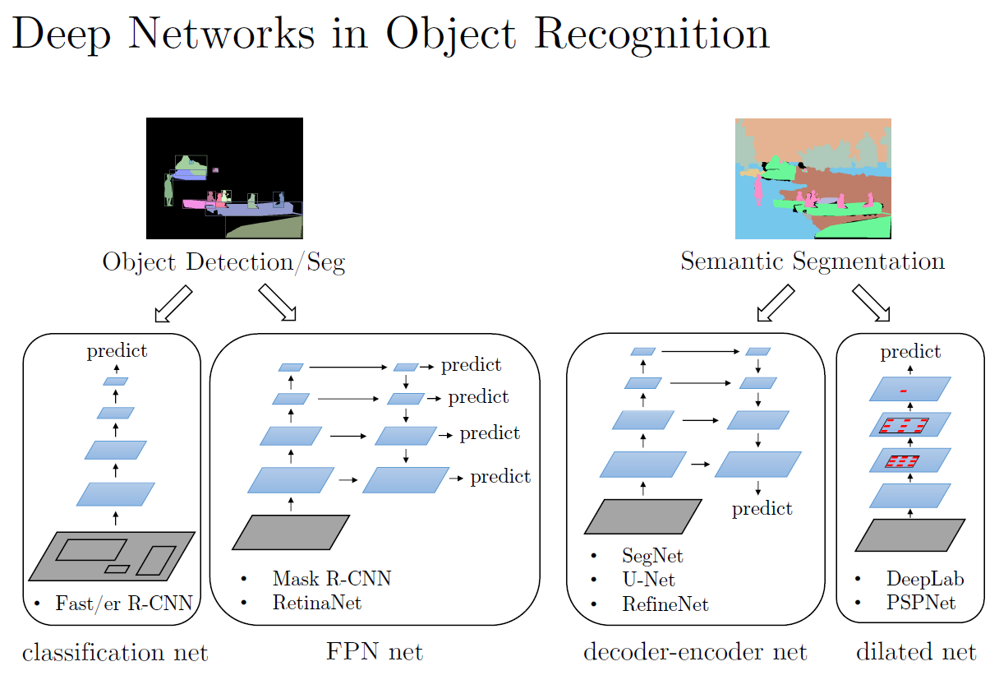

La Feature Pyramid Network (FPN) est une architecture de réseau de neurones conçue pour la détection d'objets et la segmentation d'images.  
Elle a été introduite par Lin et al. dans le papier *"Feature Pyramid Networks for Object Detection"* en 2017.  
Voici le lien vers le papier : [FPN Paper](https://arxiv.org/abs/1612.03144)

**Principes Clés**

- **Représentations multi-échelles**  
    FPN crée des représentations d'une image à différentes résolutions pour détecter des objets à différentes tailles.
    
- **Fusion de caractéristiques**  
    Contrairement à U-Net qui concatène des couches de convolution et de dé-convolution, FPN utilise des convolutions et des opérations de fusion pour combiner des caractéristiques de bas niveau (détails fins) et de haut niveau (informations contextuelles).

- **Efficacité sans surcharge de paramètres**  
    L'approche de FPN permet de capturer des informations à différentes échelles sans nécessiter un grand nombre de paramètres supplémentaires.

**Domaines d'Application**

- **Segmentation d'images médicales**  
- **Détection d'objets dans des images aériennes**  
- **Segmentation pour la conduite autonome**

FPN est particulièrement efficace pour capturer des détails fins tout en conservant une compréhension globale de l'image.

Analysons sa structure avec le backbone ResNet50:

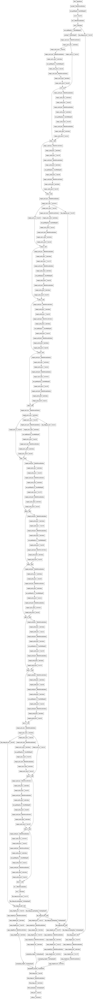

In [13]:
BACKBONE = "resnet50"

fpn_model = sm.FPN(
    BACKBONE,
    classes=8,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

tf.keras.utils.plot_model(
    fpn_model,
    "fpn_model.png",
    show_shapes=False,
    show_layer_names=True,
    rankdir="TB",  # Changed orientation to Top-Bottom for increased height
    expand_nested=False,
    dpi=30,
)


## Choix de l'encodeur

### ResNet50
Pour le choix de l'encodeur, je vais utiliser ResNet50 qui est un modèle de réseau de neurones convolutifs (CNN) proposé par Kaiming He et al. dans le papier *"Deep Residual Learning for Image Recognition"* en 2015.<br>
Voici le lien vers le papier : [ResNet Paper](https://arxiv.org/abs/1512.03385)<br>
ResNet50 est un modèle de 50 couches qui utilise des connexions résiduelles pour faciliter l'apprentissage de réseaux très profonds.<br>
Il est pré-entraîné sur le jeu de données ImageNet, qui contient plus de 14 millions d'images et 1000 classes d'objets.<br>
ResNet50 est particulièrement efficace pour la classification d'images, mais il peut également être utilisé comme encodeur dans des architectures de segmentation comme U-Net ou FPN.<br>

### EfficientNetB3
EfficientNet est une famille de modèles de réseaux de neurones convolutifs (CNN) développée par Google AI en 2019.<br>
Voici le lien vers le papier : [EfficientNet Paper](https://arxiv.org/abs/1905.11946)<br>
EfficientNetB3 est l'un des modèles de cette famille, conçu pour être à la fois efficace en termes de paramètres et performant sur des tâches de classification d'images.<br>
Il est pré-entraîné sur le jeu de données ImageNet, qui contient plus de 14 millions d'images et 1000 classes d'objets.<br>
Il est particulièrement efficace pour la classification d'images, mais il peut également être utilisé comme encodeur dans des architectures de segmentation comme U-Net ou FPN.<br>
Il est basé sur une architecture de réseau de neurones convolutifs qui utilise des blocs de convolution optimisés pour réduire le nombre de paramètres tout en maintenant une performance élevée.<br>
Son optimisation le rends plus léger et plus rapide que d'autres modèles de CNN, tout en offrant des performances comparables, voire supérieures, mais est plus sensible au fine-tuning du fait de son optimisation et de ses nombreux blocs de convolution.<br>



Regardons à présent le nombre de poids entrainables et non entrainables de l'architecture UNET et FPN avec les backbones ResNet50 et EfficientNetB3:

In [14]:
print("Using segmentation model: U-Net")
# Create a segmentation model with the specified backbone
for BACKBONE in ["efficientnetb3", "resnet50"]:
    model = sm.Unet(
        BACKBONE,
        classes=8,
        activation="softmax",
        encoder_weights="imagenet",
        input_shape=(256, 512, 3),
        encoder_freeze=True,
    )
    # Compute the number of trainable parameters
    trainable_count = np.sum(
        [tf.keras.backend.count_params(w) for w in model.trainable_weights]
    )
    non_trainable_count = np.sum(
        [tf.keras.backend.count_params(w) for w in model.non_trainable_weights]
    )
    print("===========================")
    print("Using backbone: ", BACKBONE)
    print(f"Trainable parameters: {trainable_count}")
    print(f"Non-trainable parameters: {non_trainable_count}")

Using segmentation model: U-Net
Using backbone:  efficientnetb3
Trainable parameters: 7170632
Non-trainable parameters: 10698216
Using backbone:  resnet50
Trainable parameters: 9059659
Non-trainable parameters: 23502470


In [15]:
print("Using segmentation model: FPN")
# Create a segmentation model with the specified backbone
for BACKBONE in ["efficientnetb3", "resnet50"]:
    model = sm.FPN(
        BACKBONE,
        classes=8,
        activation="softmax",
        encoder_weights="imagenet",
        input_shape=(256, 512, 3),
        encoder_freeze=True,
    )
    # Compute the number of trainable parameters
    trainable_count = np.sum(
        [tf.keras.backend.count_params(w) for w in model.trainable_weights]
    )
    non_trainable_count = np.sum(
        [tf.keras.backend.count_params(w) for w in model.non_trainable_weights]
    )
    print("===========================")
    print("Using backbone: ", BACKBONE)
    print(f"Trainable parameters: {trainable_count}")
    print(f"Non-trainable parameters: {non_trainable_count}")

Using segmentation model: FPN
Using backbone:  efficientnetb3
Trainable parameters: 3221256
Non-trainable parameters: 10698536
Using backbone:  resnet50
Trainable parameters: 3417099
Non-trainable parameters: 23502790


# 5. Fonctions utilitaires
-----------------

Fonction permettant de combiner deux phases d'entrainement (pré-entraînement et fine-tuning) en une seule phase d'entraînement à des fins d'évaluation.

In [16]:
def combine_history(
    history_pretrain: History,
    history_train: History,
    model_name: str,
) -> History:
    """Combine pretraining and training History objects into a single History object.

    Args:
        history_pretrain (tf.keras.callbacks.History): History object from the pretraining phase.
        history_train (tf.keras.callbacks.History): History object from the training phase.
        model_name (str): Custom name to assign to the combined model's history.

    Returns:
        tf.keras.callbacks.History: A History object that contains the combined history.
    """
    # Create a new History object to hold the merged history.
    history = tf.keras.callbacks.History()

    # Combine the metric histories by concatenating the lists from pretraining and training.
    history.history = {
        k: history_pretrain.history[k] + history_train.history[k]
        for k in history_pretrain.history.keys()
    }

    # Merge the parameters from both history objects.
    # For 'verbose', set it explicitly to 1.
    history.params = {
        k: history_pretrain.params[k] + history_train.params[k]
        if k != "verbose"
        else {"verbose": 1}
        for k in history_pretrain.params.keys()
    }

    # Create a complete epoch list for both phases.
    history.epoch = list(range(len(history_pretrain.epoch) + len(history_train.epoch)))

    # Set the model from the training history and update its custom name.
    history.model = history_train.model
    history.model.custom_name = model_name

    return history

# 6. Training and Evaluation
-----------------

## U-net + ResNet 50

### 60. Transfer Learning

In [13]:
BACKBONE = "resnet50"
SEGMENTATION_MODEL = "u-net"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [ ]:
model = sm.Unet(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 60

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=5,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Train the full model for 50 epochs
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=47,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)


In [14]:
history.model.custom_name = f"{SEGMENTATION_MODEL}_{BACKBONE}"

# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 1s 585ms/step
Inference time on a unique prediction: 0.69 seconds


In [ ]:
try:
    new_folder = 60
    model_metric = ModelMetric.from_pickle(
        pickle_path=f"../artifacts/{new_folder}/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        f"../artifacts/{new_folder}/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )


except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


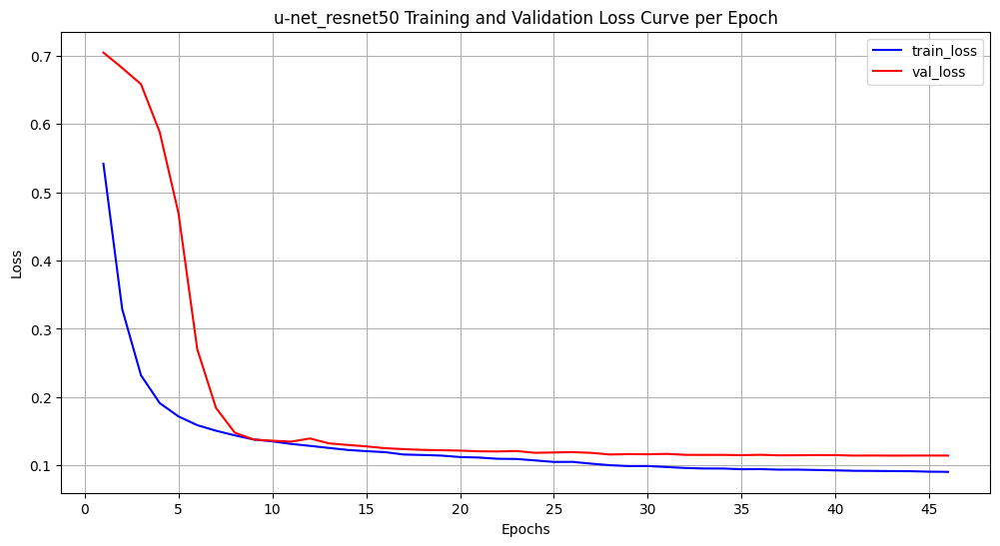

Best epoch:  40
Best Validation Loss:  0.1144


In [15]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

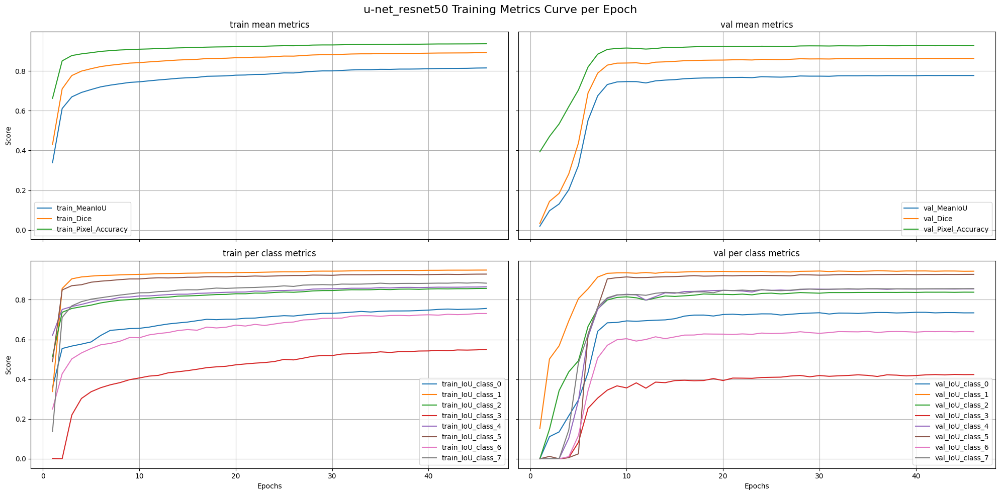

Best Validation MeanIoU:  0.7773
Best Validation Pixel Accuracy:  0.9274
Best Validation Dice:  0.8631


In [16]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

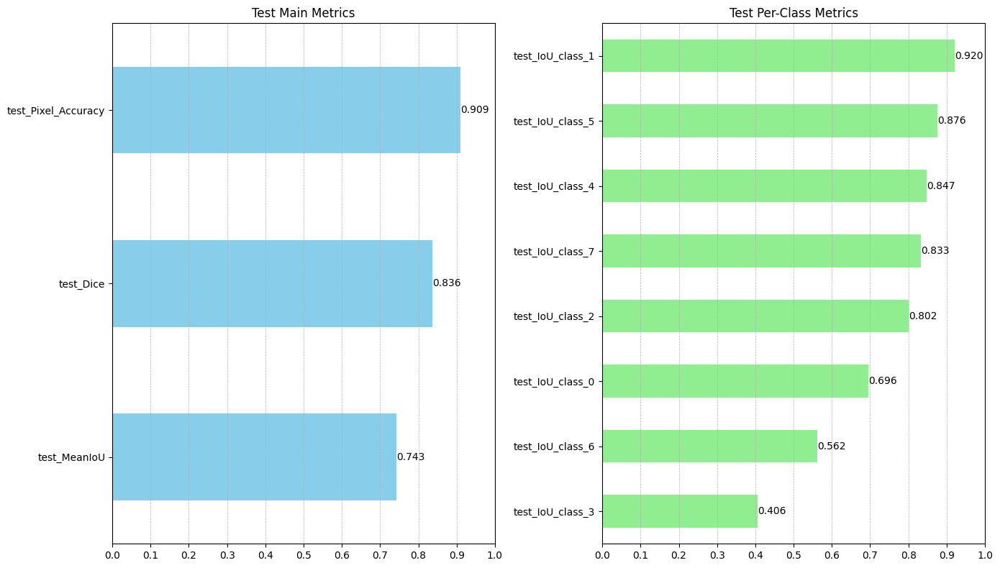

In [17]:
model_metric.plot_test_metrics()

1/1 [==============================] - 1s 581ms/step


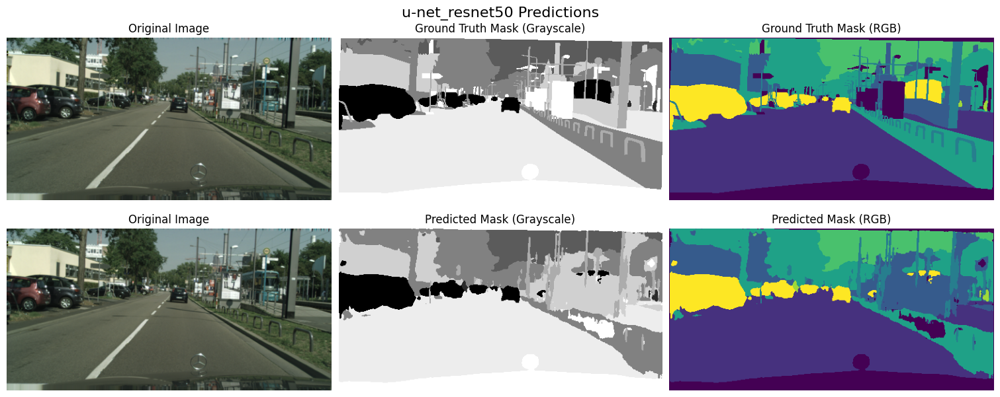

In [18]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [19]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 151ms/step


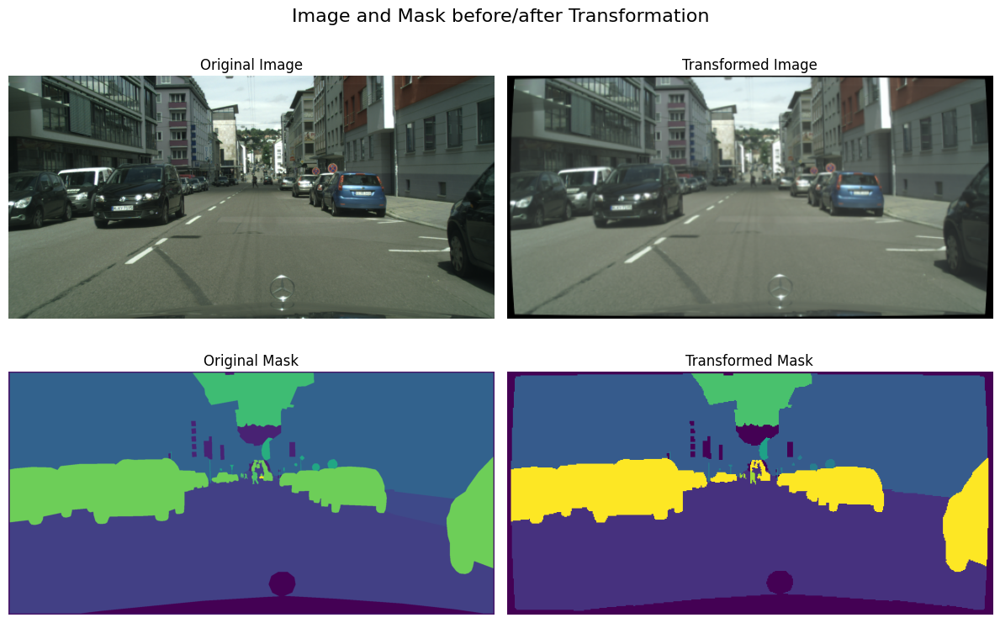

In [20]:
train_datagen.show_transformation(index=5)

### 605. Fine-Tuning ML & HL Features

In [21]:
BACKBONE = "resnet50"
SEGMENTATION_MODEL = "u-net"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [17]:
model = sm.Unet(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 605

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=6,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Pretrain the model decoder for the 2 first epochs
history_pretrain = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=3,
    workers=NUM_WORKERS,
)

for i, layer in enumerate(model.layers):
    if i >= 86:
        layer.trainable = True

# Recompiler
model.compile(
    optimizer=optimizer, loss=loss_fn, metrics=mean_metrics + per_class_metrics
)

# Train the full model for 50 epochs
history_train = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=65,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)


Epoch 1/3


/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_5:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_4:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_1:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_7:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_6:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_2:0", shape=(4,), dtype=int32))) to a den

149/149 [==============================] - 1686s 11s/step - loss: 0.5374 - MeanIoU: 0.3102 - Dice: 0.3897 - Pixel_Accuracy: 0.6163 - IoU_class_0: 0.4574 - IoU_class_1: 0.7106 - IoU_class_2: 0.5047 - IoU_class_3: 1.1911e-05 - IoU_class_4: 3.2708e-11 - IoU_class_5: 1.4099e-10 - IoU_class_6: 0.2248 - IoU_class_7: 0.5843 - val_loss: 0.7114 - val_MeanIoU: 0.0693 - val_Dice: 0.1040 - val_Pixel_Accuracy: 0.4141 - val_IoU_class_0: 0.1427 - val_IoU_class_1: 0.4115 - val_IoU_class_2: 2.4459e-11 - val_IoU_class_3: 3.0817e-10 - val_IoU_class_4: 3.6311e-11 - val_IoU_class_5: 1.5928e-10 - val_IoU_class_6: 5.4831e-10 - val_IoU_class_7: 7.7157e-11
Epoch 2/3
149/149 [==============================] - 1693s 11s/step - loss: 0.3584 - MeanIoU: 0.5541 - Dice: 0.6476 - Pixel_Accuracy: 0.8359 - IoU_class_0: 0.5636 - IoU_class_1: 0.8947 - IoU_class_2: 0.7383 - IoU_class_3: 0.0022 - IoU_class_4: 0.4293 - IoU_class_5: 0.6772 - IoU_class_6: 0.3944 - IoU_class_7: 0.7329 - val_loss: 0.7027 - val_MeanIoU: 0.0842 - 

In [18]:
# Create a keras history object from the training history and pretrain history
history = combine_history(
    history_pretrain, history_train, f"{SEGMENTATION_MODEL}_{BACKBONE}"
)


In [19]:
history.model.custom_name = f"{SEGMENTATION_MODEL}_{BACKBONE}"

# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 1s 613ms/step
Inference time on a unique prediction: 0.73 seconds


In [ ]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/605/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/605/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


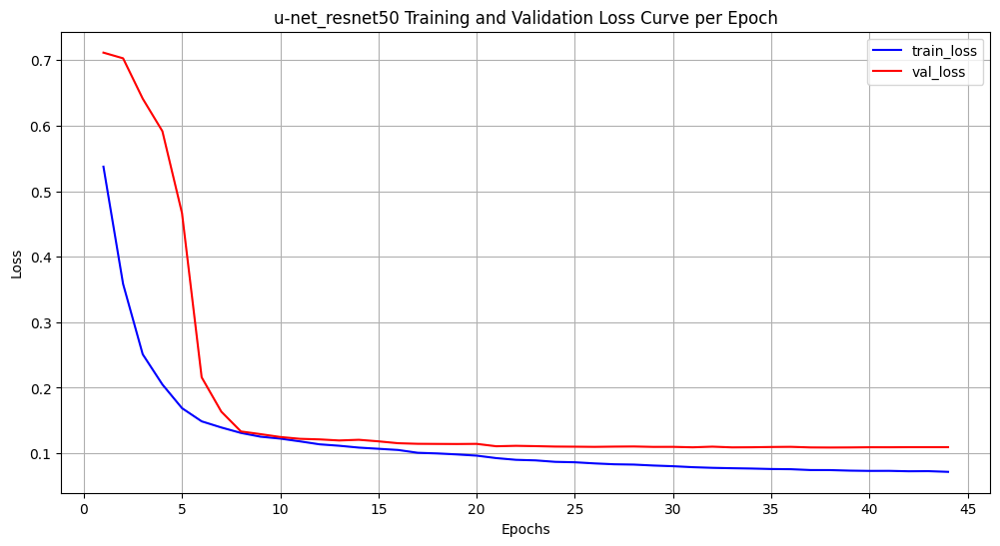

Best epoch:  37
Best Validation Loss:  0.1088


In [23]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

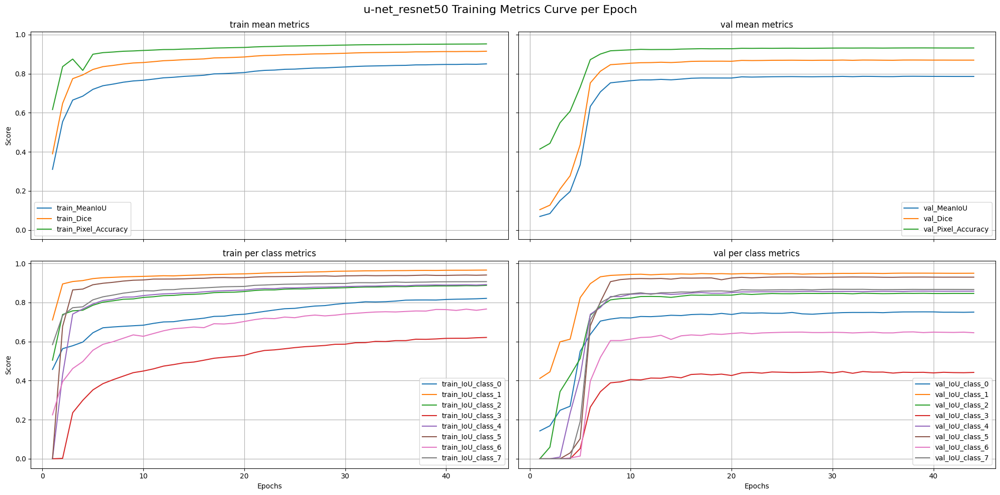

Best Validation MeanIoU:  0.7867
Best Validation Pixel Accuracy:  0.9317
Best Validation Dice:  0.8698


In [24]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

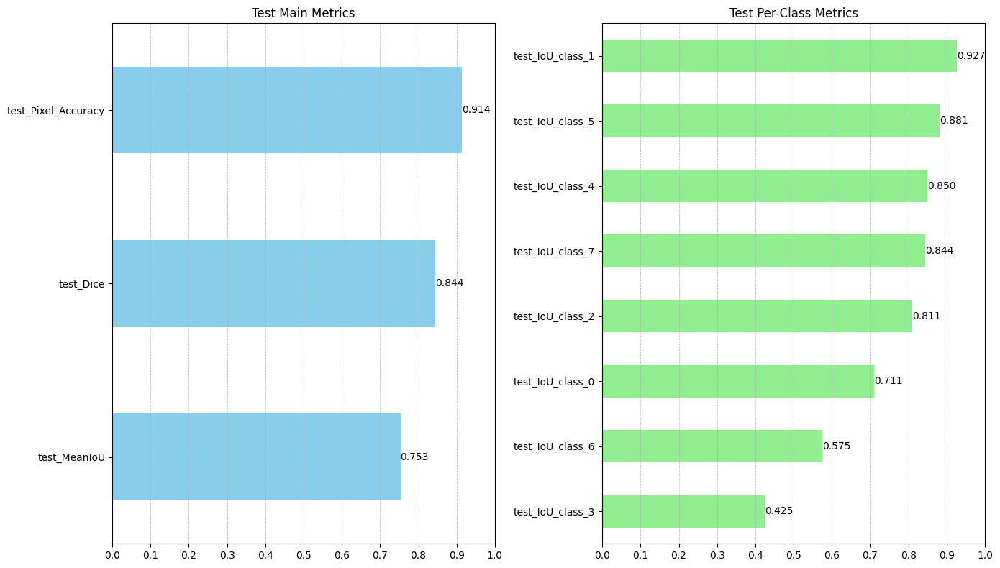

In [25]:
model_metric.plot_test_metrics()

1/1 [==============================] - 1s 544ms/step


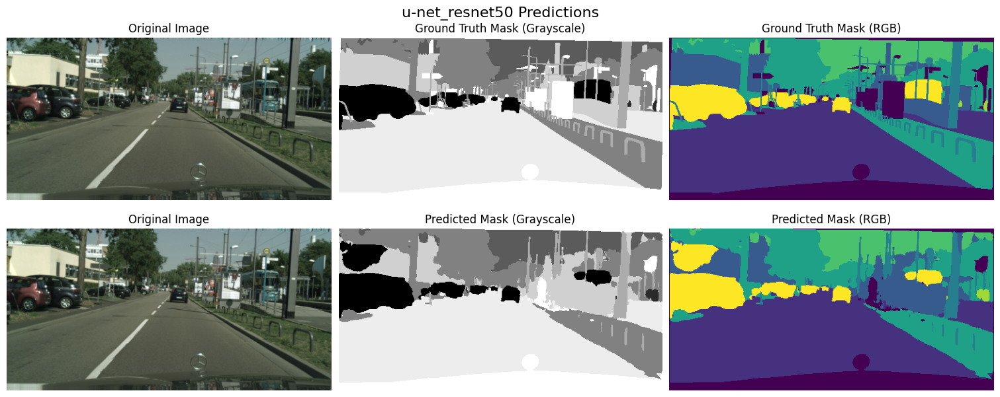

In [26]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [27]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 138ms/step


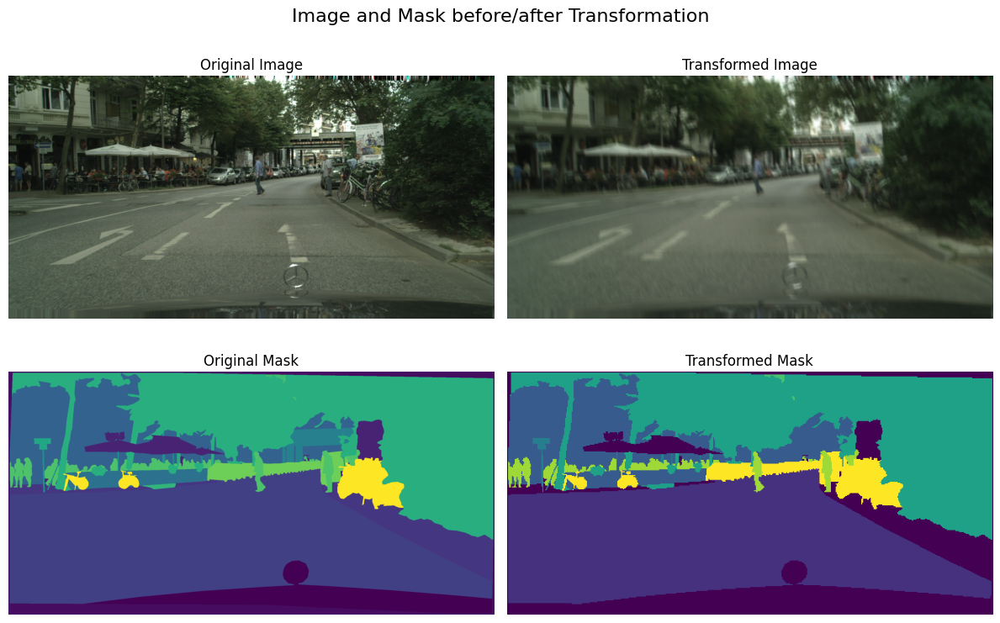

In [28]:
train_datagen.show_transformation(index=5)

### 610. Full Fine-Tuning

In [29]:
BACKBONE = "resnet50"
SEGMENTATION_MODEL = "u-net"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [ ]:
model = sm.Unet(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 61

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=4,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Pretrain the model decoder for the 2 first epochs
history_pretrain = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=3,
    workers=NUM_WORKERS,
)

for layer in model.layers:
    layer.trainable = True  # Ou False selon le besoin

# Recompiler
model.compile(
    optimizer=optimizer, loss=loss_fn, metrics=mean_metrics + per_class_metrics
)

# Train the full model for 50 epochs
history_train = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=47,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)


Epoch 1/3


/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_5:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_4:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_1:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_7:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_6:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_2:0", shape=(4,), dtype=int32))) to a den

149/149 [==============================] - 1747s 12s/step - loss: 0.5429 - MeanIoU: 0.3369 - Dice: 0.4275 - Pixel_Accuracy: 0.6577 - IoU_class_0: 0.3456 - IoU_class_1: 0.2859 - IoU_class_2: 0.5015 - IoU_class_3: 0.0014 - IoU_class_4: 0.6148 - IoU_class_5: 0.4894 - IoU_class_6: 0.2730 - IoU_class_7: 0.1838 - val_loss: 0.7219 - val_MeanIoU: 0.0030 - val_Dice: 0.0059 - val_Pixel_Accuracy: 0.2162 - val_IoU_class_0: 0.0039 - val_IoU_class_1: 0.0085 - val_IoU_class_2: 0.0116 - val_IoU_class_3: 3.0817e-10 - val_IoU_class_4: 3.6311e-11 - val_IoU_class_5: 1.5928e-10 - val_IoU_class_6: 5.4831e-10 - val_IoU_class_7: 7.7157e-11
Epoch 2/3
149/149 [==============================] - 1701s 11s/step - loss: 0.3392 - MeanIoU: 0.6111 - Dice: 0.7100 - Pixel_Accuracy: 0.8517 - IoU_class_0: 0.5638 - IoU_class_1: 0.8423 - IoU_class_2: 0.7394 - IoU_class_3: 2.8009e-10 - IoU_class_4: 0.7473 - IoU_class_5: 0.8533 - IoU_class_6: 0.4243 - IoU_class_7: 0.7182 - val_loss: 0.6965 - val_MeanIoU: 0.0798 - val_Dice: 0.

In [13]:
# Create a keras history object from the training history and pretrain history
history = combine_history(
    history_pretrain, history_train, f"{SEGMENTATION_MODEL}_{BACKBONE}"
)


In [15]:
# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 1s 641ms/step
Inference time on a unique prediction: 0.76 seconds


In [ ]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/61/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/61/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


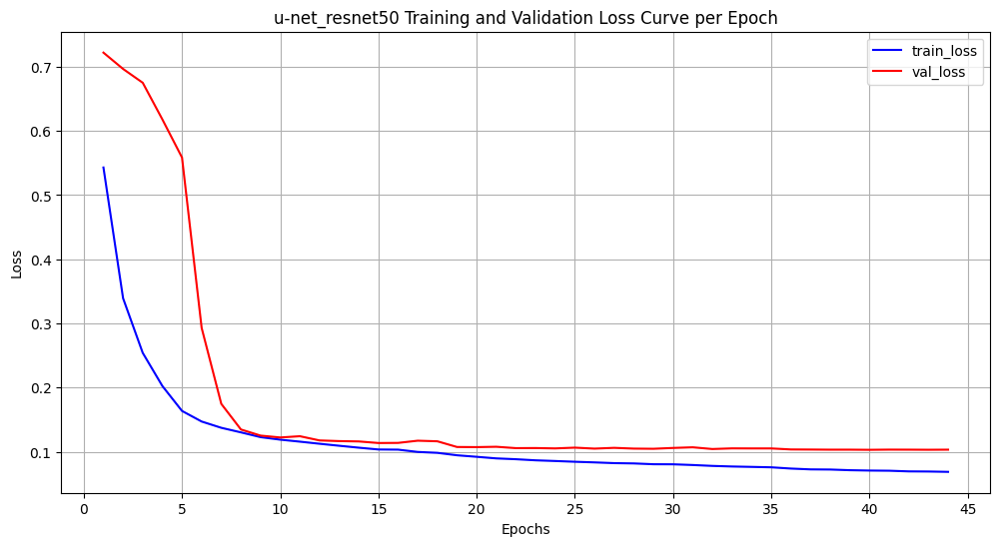

Best epoch:  39
Best Validation Loss:  0.1031


In [31]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

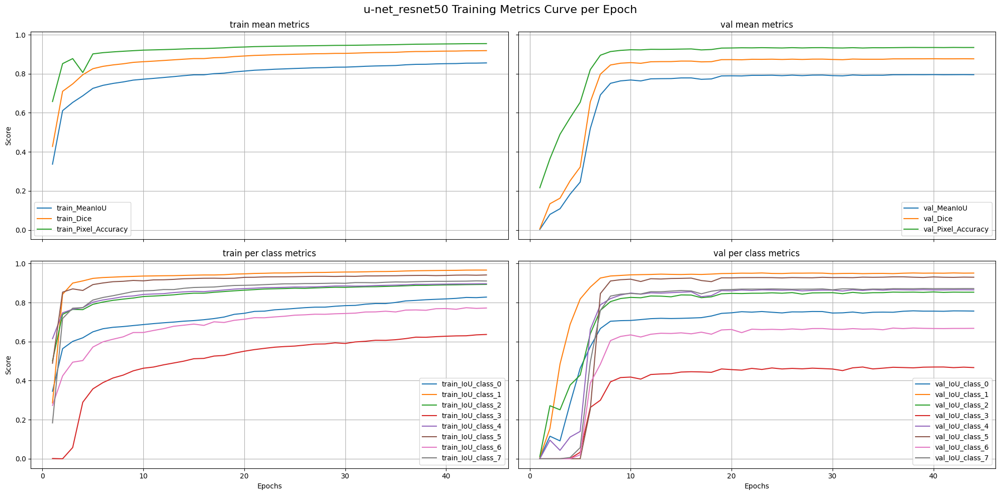

Best Validation MeanIoU:  0.7956
Best Validation Pixel Accuracy:  0.9344
Best Validation Dice:  0.8767


In [32]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

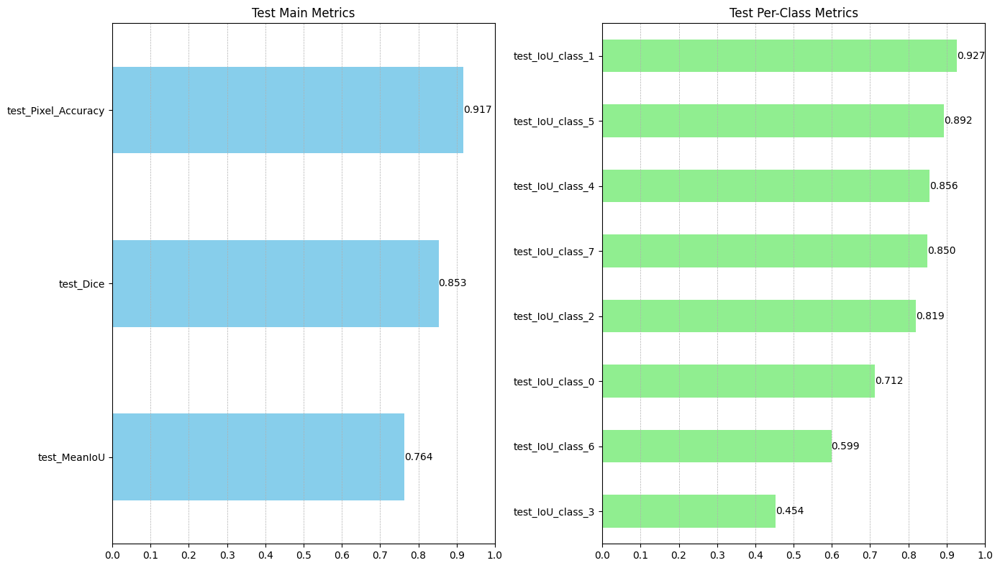

In [33]:
model_metric.plot_test_metrics()

1/1 [==============================] - 1s 547ms/step


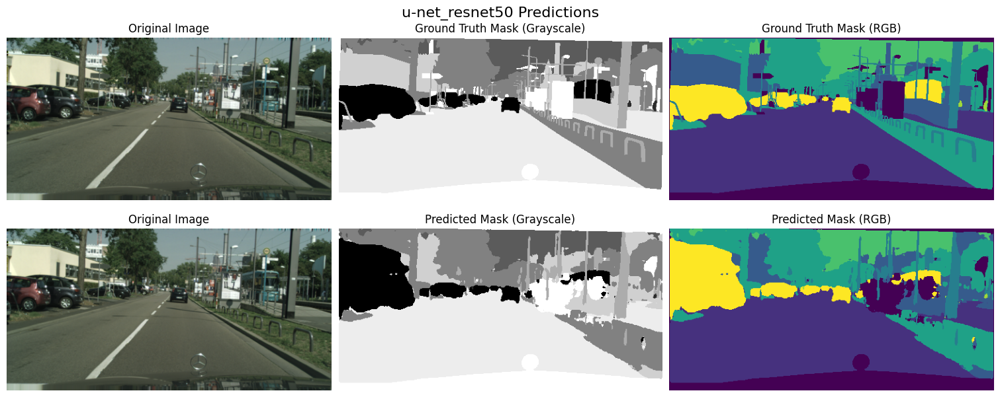

In [34]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [35]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 132ms/step


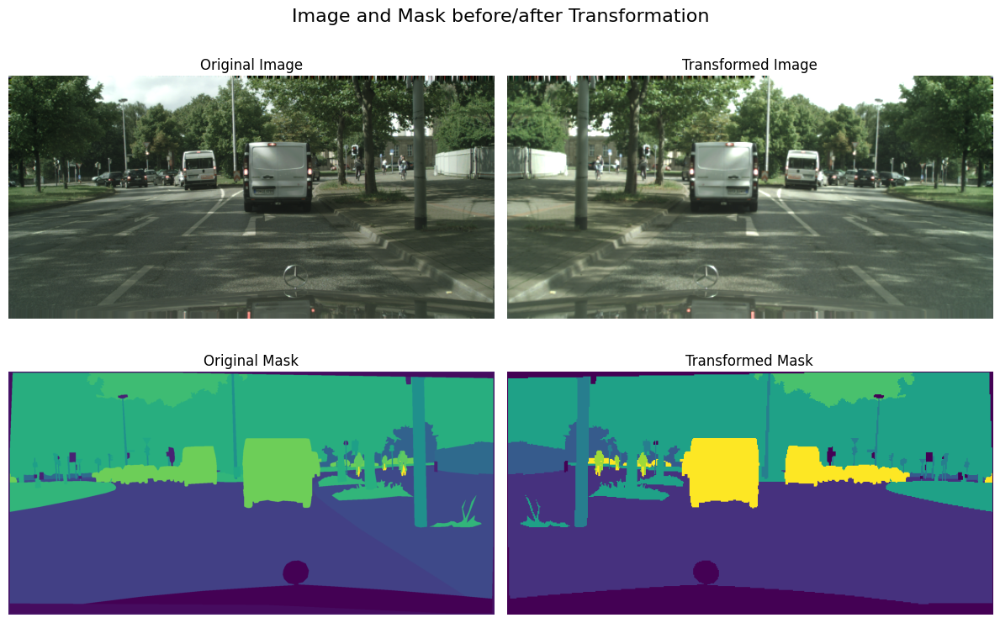

In [36]:
train_datagen.show_transformation(index=3)

## U-Net + efficientnetb3

### 615. Transfer Learning

In [37]:
BACKBONE = "efficientnetb3"
SEGMENTATION_MODEL = "u-net"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [ ]:
model = sm.Unet(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 615

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=6,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate 2
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Train the full model for 50 epochs
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=50,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)


Epoch 1/50


/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_5:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_4:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_1:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_7:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_6:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_2:0", shape=(4,), dtype=int32))) to a den

149/149 [==============================] - 1876s 13s/step - loss: 0.6105 - MeanIoU: 0.2023 - Dice: 0.2687 - Pixel_Accuracy: 0.5608 - IoU_class_0: 0.1474 - IoU_class_1: 0.1784 - IoU_class_2: 0.0421 - IoU_class_3: 0.0208 - IoU_class_4: 0.1840 - IoU_class_5: 0.6106 - IoU_class_6: 8.1901e-05 - IoU_class_7: 0.4351 - val_loss: 0.7030 - val_MeanIoU: 3.4650e-04 - val_Dice: 6.8885e-04 - val_Pixel_Accuracy: 0.4375 - val_IoU_class_0: 5.5315e-11 - val_IoU_class_1: 0.0027 - val_IoU_class_2: 2.4459e-11 - val_IoU_class_3: 3.0817e-10 - val_IoU_class_4: 4.3909e-05 - val_IoU_class_5: 1.5928e-10 - val_IoU_class_6: 5.4831e-10 - val_IoU_class_7: 7.7157e-11 - lr: 5.0000e-05
Epoch 2/50
149/149 [==============================] - 1834s 12s/step - loss: 0.4430 - MeanIoU: 0.4879 - Dice: 0.5830 - Pixel_Accuracy: 0.8195 - IoU_class_0: 0.4671 - IoU_class_1: 0.8080 - IoU_class_2: 0.4270 - IoU_class_3: 0.0187 - IoU_class_4: 0.7125 - IoU_class_5: 0.8017 - IoU_class_6: 5.1048e-10 - IoU_class_7: 0.6684 - val_loss: 0.584

In [15]:
history.model.custom_name = f"{SEGMENTATION_MODEL}_{BACKBONE}"

# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 4s 4s/step
Inference time on a unique prediction: 3.74 seconds


In [ ]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/615/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/615/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


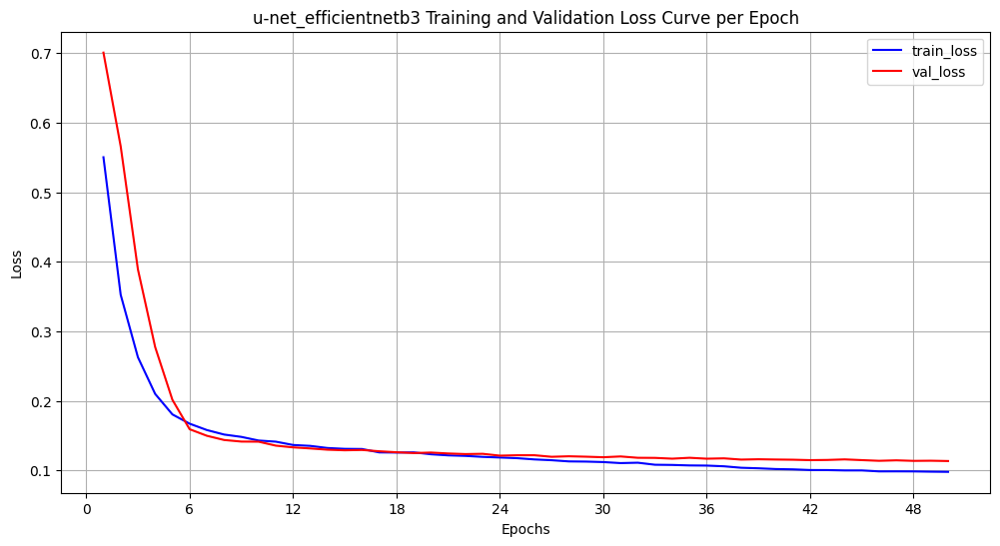

Best epoch:  49
Best Validation Loss:  0.1135


In [39]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

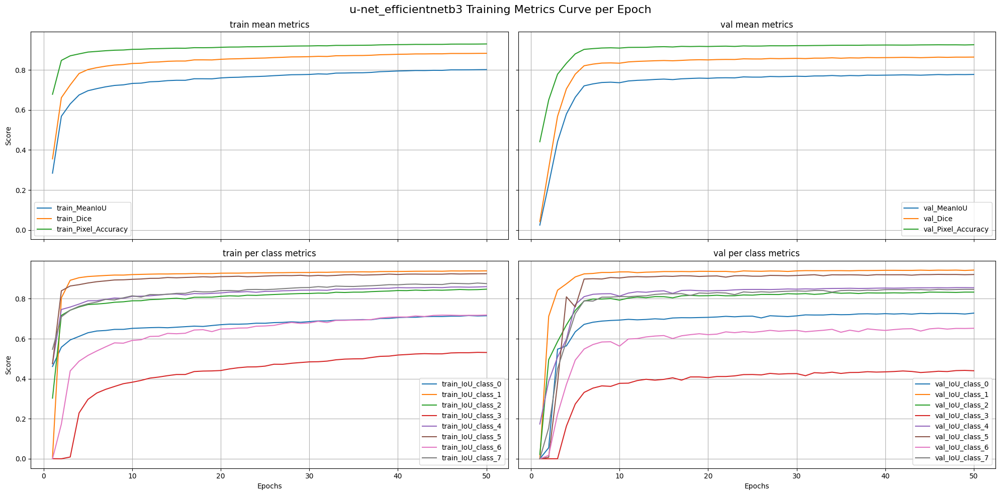

Best Validation MeanIoU:  0.7776
Best Validation Pixel Accuracy:  0.926
Best Validation Dice:  0.8643


In [40]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

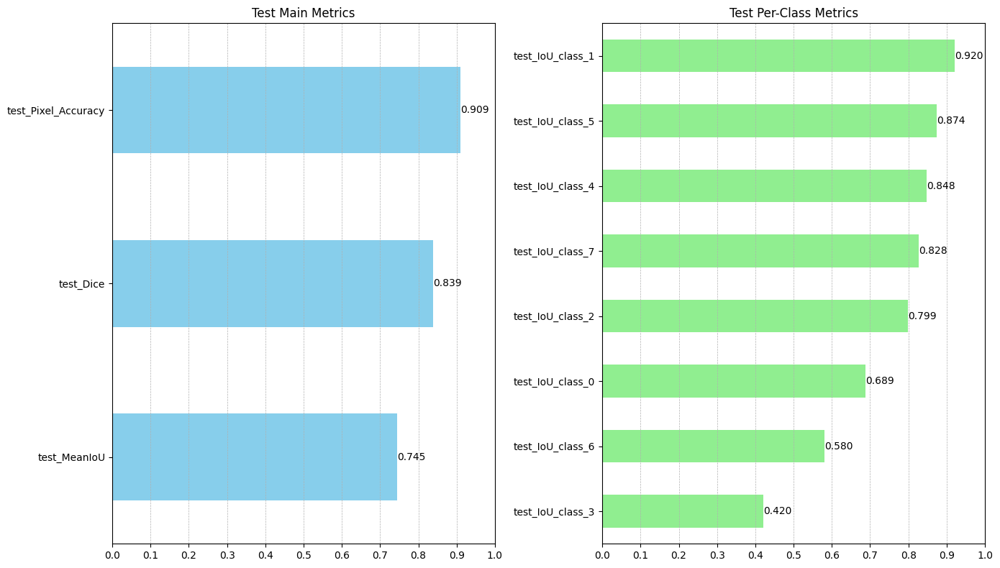

In [41]:
model_metric.plot_test_metrics()

1/1 [==============================] - 1s 1s/step


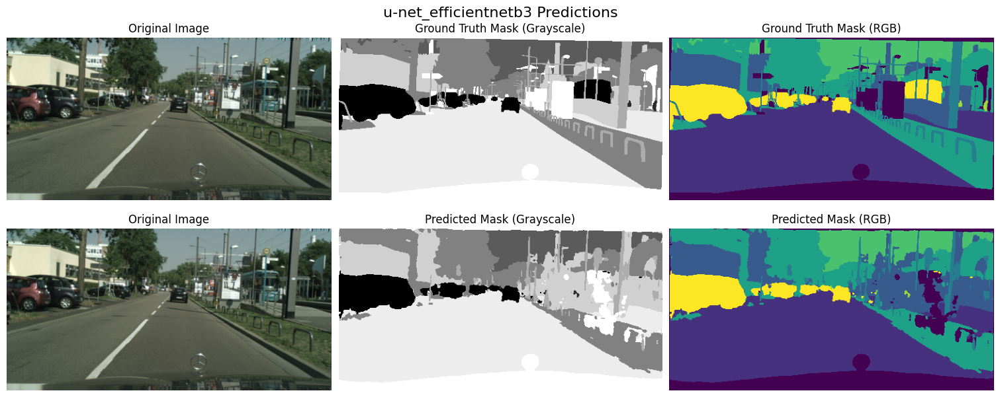

In [42]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [43]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 160ms/step


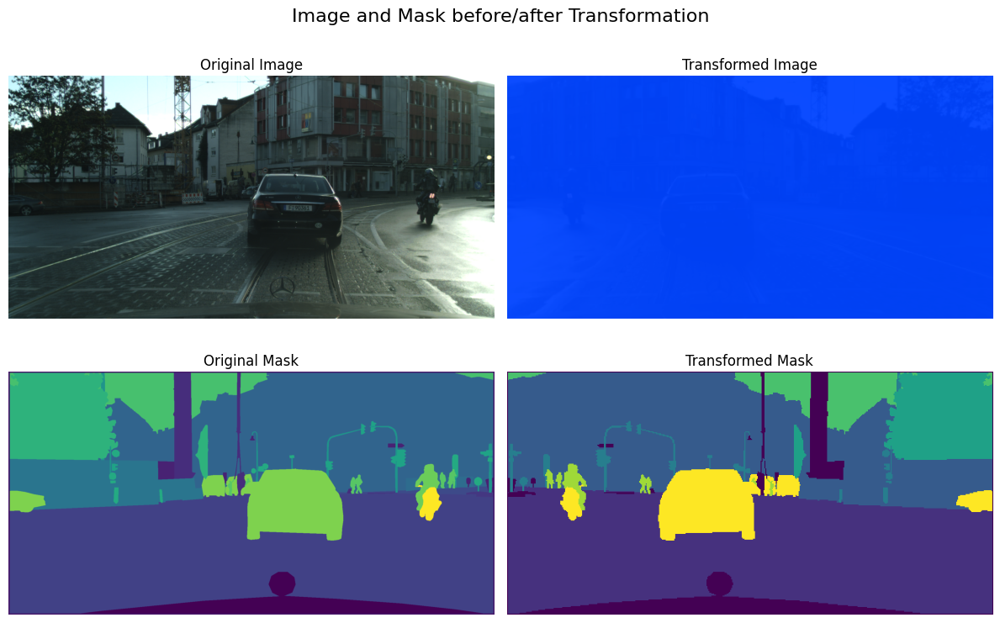

In [44]:
train_datagen.show_transformation(index=5)

### 62. Fine-Tuning ML & HL Features

In [15]:
BACKBONE = "efficientnetb3"
SEGMENTATION_MODEL = "u-net"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [16]:
model = sm.Unet(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 62

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=4,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Pretrain the model decoder for the 2 first epochs
history_pretrain = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=3,
    workers=NUM_WORKERS,
)

for i, layer in enumerate(model.layers):
    if i >= 112:
        layer.trainable = True

# Recompiler
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
# Recompiler
model.compile(
    optimizer=optimizer, loss=loss_fn, metrics=mean_metrics + per_class_metrics
)

# Train the full model for 50 epochs
history_train = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=50,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)


Epoch 1/3


/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_5:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_4:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_1:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_7:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_6:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_2:0", shape=(4,), dtype=int32))) to a den

149/149 [==============================] - 1836s 12s/step - loss: 0.5183 - MeanIoU: 0.3395 - Dice: 0.4138 - Pixel_Accuracy: 0.7047 - IoU_class_0: 0.4403 - IoU_class_1: 0.5798 - IoU_class_2: 0.4689 - IoU_class_3: 2.2315e-06 - IoU_class_4: 0.4773 - IoU_class_5: 0.5417 - IoU_class_6: 0.0027 - IoU_class_7: 0.2054 - val_loss: 0.6651 - val_MeanIoU: 0.1105 - val_Dice: 0.1605 - val_Pixel_Accuracy: 0.4630 - val_IoU_class_0: 5.5315e-11 - val_IoU_class_1: 0.5408 - val_IoU_class_2: 0.1440 - val_IoU_class_3: 3.0817e-10 - val_IoU_class_4: 0.1995 - val_IoU_class_5: 1.5928e-10 - val_IoU_class_6: 5.4831e-10 - val_IoU_class_7: 7.7157e-11
Epoch 2/3
149/149 [==============================] - 1810s 12s/step - loss: 0.3224 - MeanIoU: 0.5881 - Dice: 0.6821 - Pixel_Accuracy: 0.8543 - IoU_class_0: 0.5529 - IoU_class_1: 0.8792 - IoU_class_2: 0.7227 - IoU_class_3: 2.8010e-10 - IoU_class_4: 0.7376 - IoU_class_5: 0.8510 - IoU_class_6: 0.2643 - IoU_class_7: 0.6967 - val_loss: 0.5467 - val_MeanIoU: 0.2433 - val_Dice

In [17]:
# Create a keras history object from the training history and pretrain history
history = combine_history(
    history_pretrain, history_train, f"{SEGMENTATION_MODEL}_{BACKBONE}"
)


In [18]:
history.model.custom_name = f"{SEGMENTATION_MODEL}_{BACKBONE}"

# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 10s 10s/step
Inference time on a unique prediction: 10.34 seconds


In [19]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/62/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/62/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )
    # Save the metrics
    model_metric.save_metrics()

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


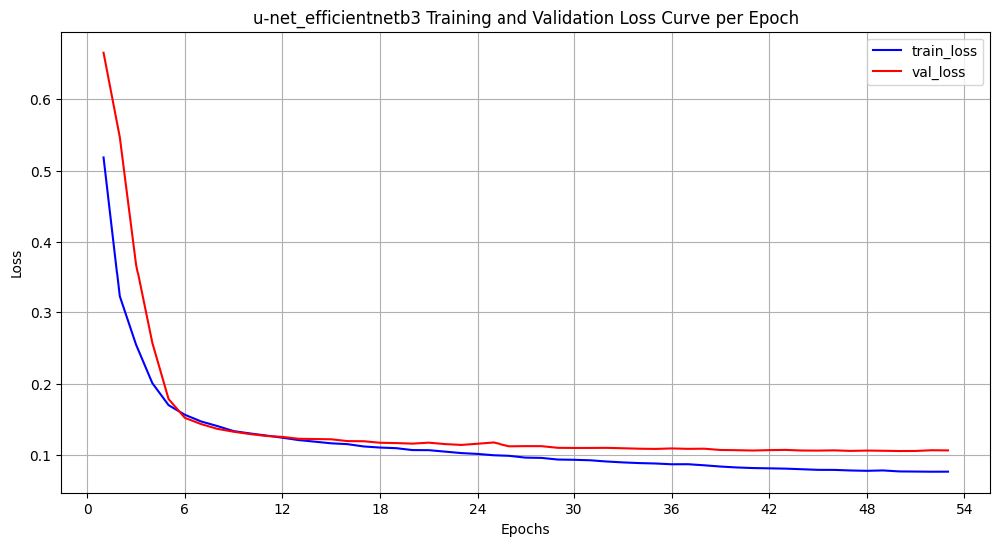

Best epoch:  49
Best Validation Loss:  0.1054


In [20]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

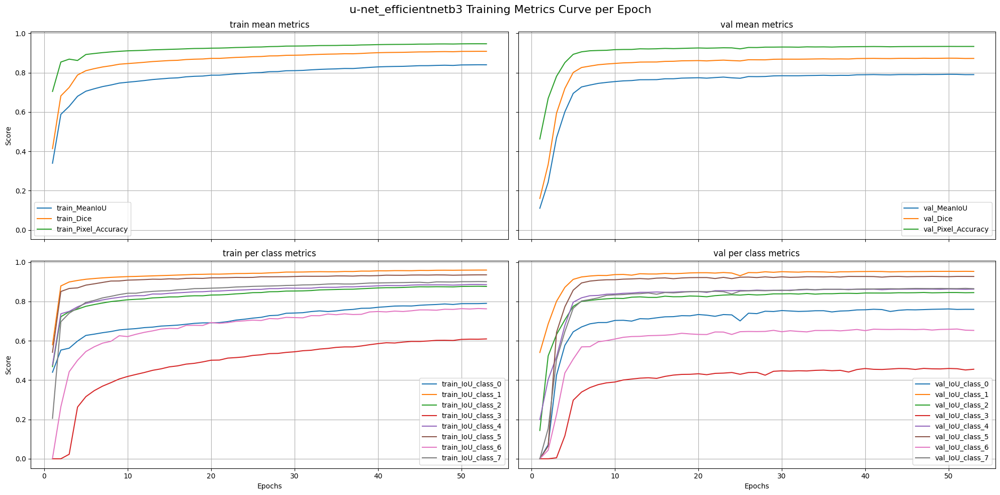

Best Validation MeanIoU:  0.7919
Best Validation Pixel Accuracy:  0.9337
Best Validation Dice:  0.8739


In [21]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

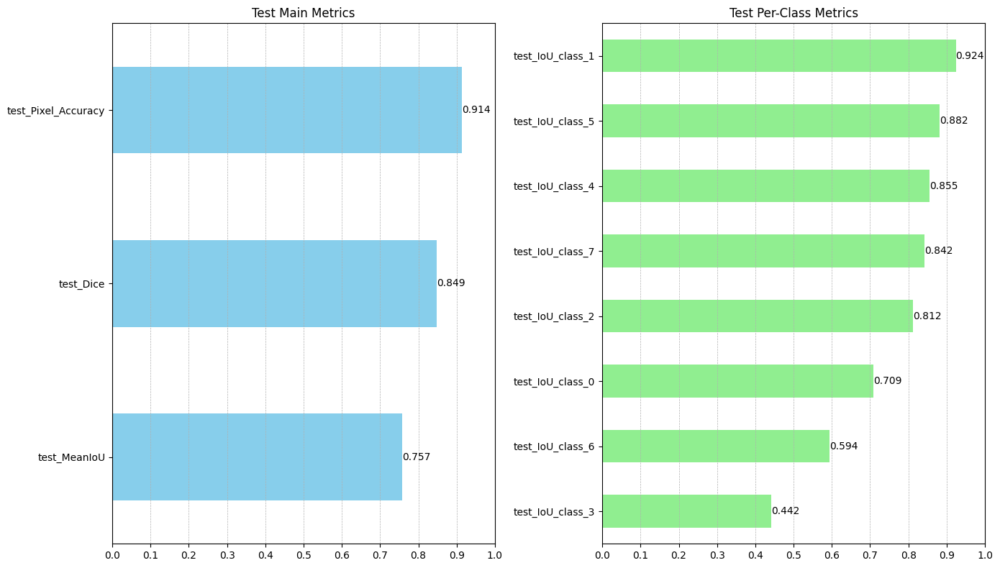

In [22]:
model_metric.plot_test_metrics()

1/1 [==============================] - 0s 141ms/step


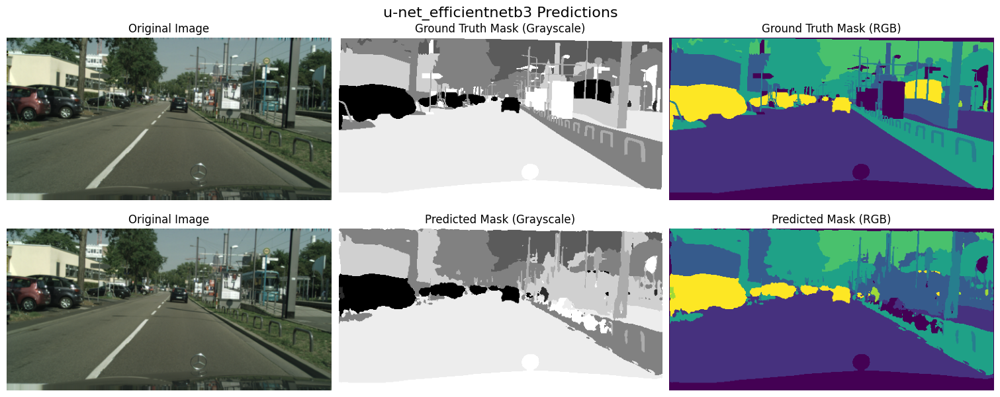

In [23]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [24]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 131ms/step


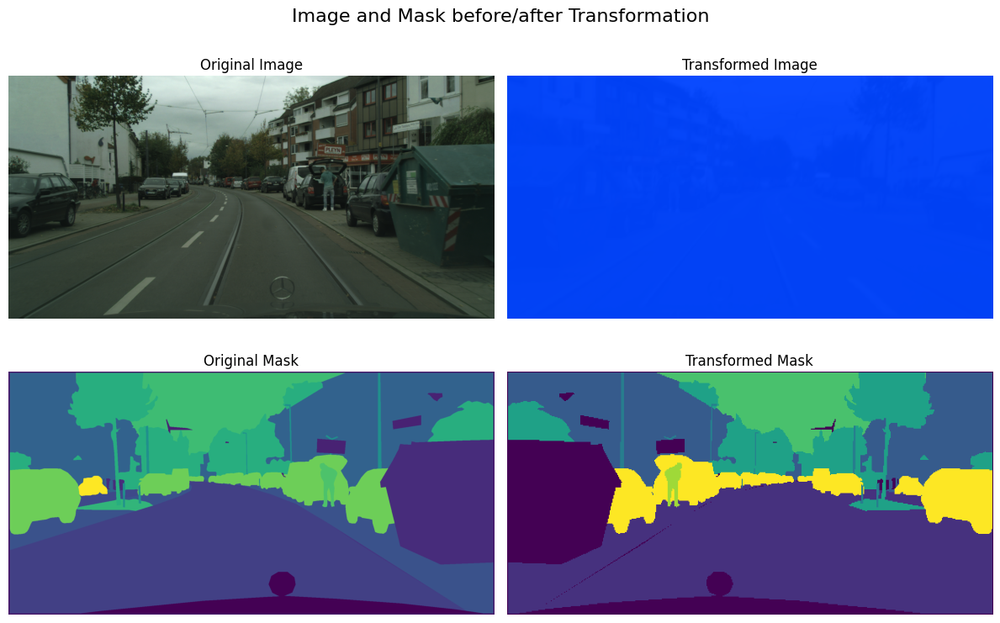

In [25]:
train_datagen.show_transformation(index=5)

### 625. Full Fine-Tuning

In [46]:
BACKBONE = "efficientnetb3"
SEGMENTATION_MODEL = "u-net"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [22]:
model = sm.Unet(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 625

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=5,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Pretrain the model decoder for the 2 first epochs
history_pretrain = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=3,
    workers=NUM_WORKERS,
)

for layer in model.layers:
    layer.trainable = True

# Recompiler
optimizer = tf.keras.optimizers.Adam(learning_rate=5e-5)
# Recompiler
model.compile(
    optimizer=optimizer, loss=loss_fn, metrics=mean_metrics + per_class_metrics
)

# Train the full model for 50 epochs
history_train = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=80,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)


Epoch 1/3


/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_5:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_4:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_1:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_7:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_6:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_2:0", shape=(4,), dtype=int32))) to a den

149/149 [==============================] - 1843s 12s/step - loss: 0.5547 - MeanIoU: 0.2875 - Dice: 0.3556 - Pixel_Accuracy: 0.6827 - IoU_class_0: 0.3040 - IoU_class_1: 1.2334e-11 - IoU_class_2: 0.3463 - IoU_class_3: 1.6641e-04 - IoU_class_4: 0.6355 - IoU_class_5: 0.5117 - IoU_class_6: 0.0116 - IoU_class_7: 0.4908 - val_loss: 0.6963 - val_MeanIoU: 0.0286 - val_Dice: 0.0478 - val_Pixel_Accuracy: 0.4595 - val_IoU_class_0: 5.5315e-11 - val_IoU_class_1: 1.3503e-11 - val_IoU_class_2: 0.0184 - val_IoU_class_3: 3.0817e-10 - val_IoU_class_4: 0.2103 - val_IoU_class_5: 1.5928e-10 - val_IoU_class_6: 5.4831e-10 - val_IoU_class_7: 7.7157e-11
Epoch 2/3
149/149 [==============================] - 1803s 12s/step - loss: 0.3711 - MeanIoU: 0.5628 - Dice: 0.6655 - Pixel_Accuracy: 0.8350 - IoU_class_0: 0.5766 - IoU_class_1: 0.5407 - IoU_class_2: 0.7247 - IoU_class_3: 0.0061 - IoU_class_4: 0.7407 - IoU_class_5: 0.8464 - IoU_class_6: 0.3567 - IoU_class_7: 0.7110 - val_loss: 0.5677 - val_MeanIoU: 0.2507 - val_

In [23]:
# Create a keras history object from the training history and pretrain history
history = combine_history(
    history_pretrain, history_train, f"{SEGMENTATION_MODEL}_{BACKBONE}"
)


In [24]:
history.model.custom_name = f"{SEGMENTATION_MODEL}_{BACKBONE}"

# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 1s 1s/step
Inference time on a unique prediction: 1.64 seconds


In [ ]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/625/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/625/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


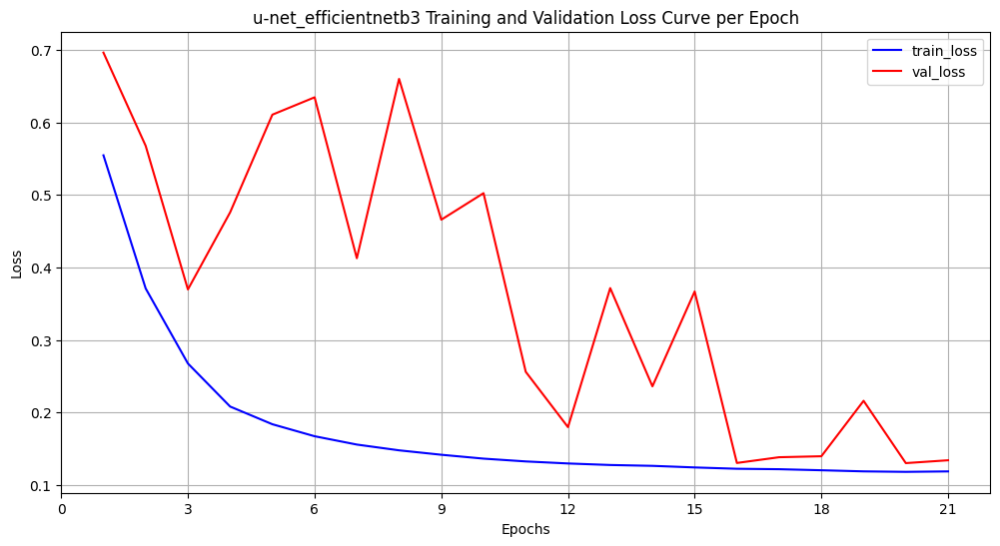

Best epoch:  15
Best Validation Loss:  0.1305


In [48]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

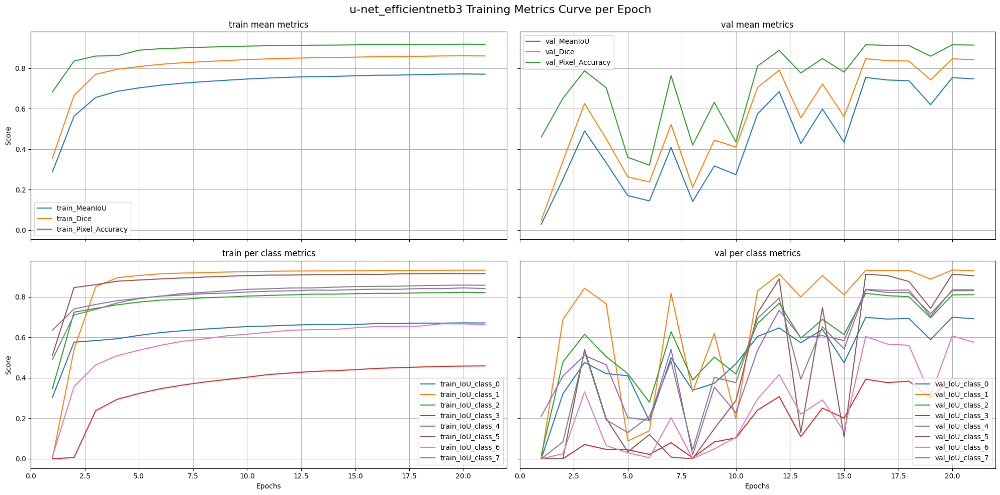

Best Validation MeanIoU:  0.7539
Best Validation Pixel Accuracy:  0.9156
Best Validation Dice:  0.8467


In [49]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

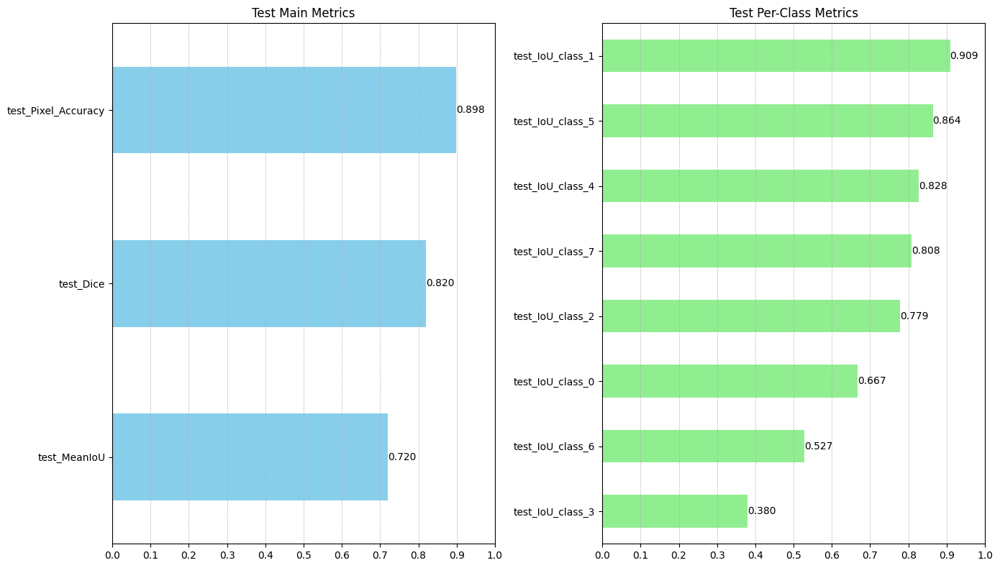

In [50]:
model_metric.plot_test_metrics()

1/1 [==============================] - 1s 1s/step


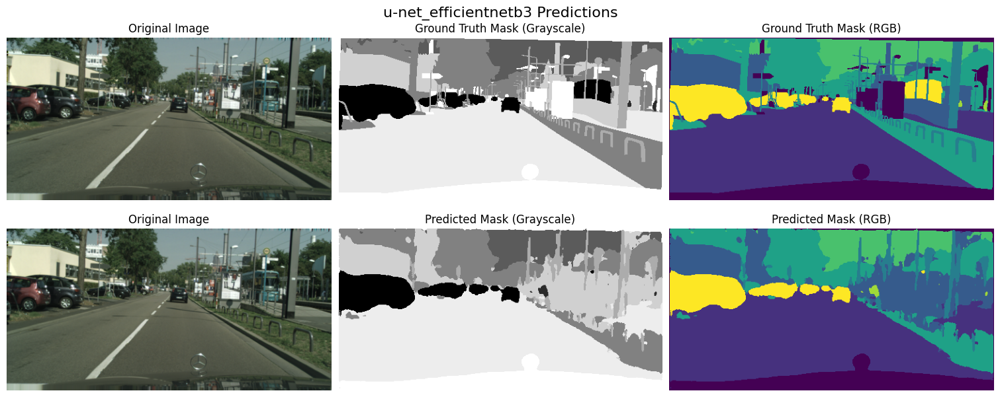

In [51]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [52]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 168ms/step


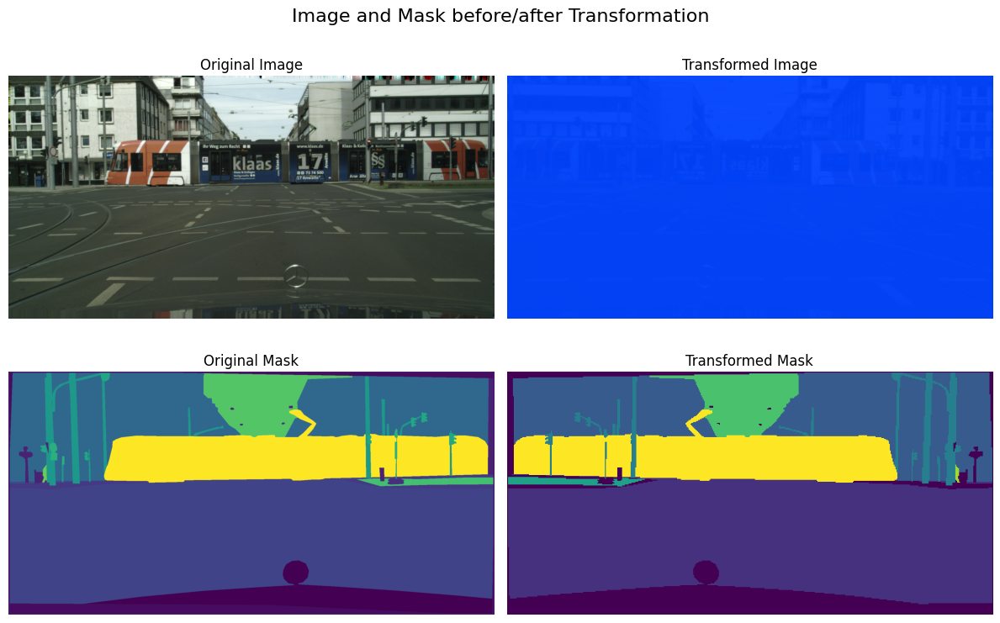

In [53]:
train_datagen.show_transformation(index=5)

## FPN + Resnet50

2. Différences entre UNet et FPN
UNet est conçu pour bien récupérer les détails locaux grâce aux skip connections. Même si l’encodeur est légèrement déstabilisé, le modèle peut compenser avec les informations des couches de bas niveau.
FPN repose davantage sur une agrégation pyramidale, ce qui rend la qualité des features de l’encodeur encore plus cruciale.
💡 Hypothèse : Le FPN dépend davantage d’un encodeur stable, donc le dégel doit être plus progressif.

### 63. Transfer Learning

In [54]:
BACKBONE = "resnet50"
SEGMENTATION_MODEL = "FPN"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [ ]:
model = sm.FPN(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 63

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=4,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Train the full model for 50 epochs
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=50,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)

Epoch 1/100
149/149 [==============================] - 3117s 21s/step - loss: 0.3203 - MeanIoU: 0.5094 - Dice: 0.6291 - Pixel_Accuracy: 0.8055 - IoU_class_0: 0.4822 - IoU_class_1: 0.7731 - IoU_class_2: 0.6134 - IoU_class_3: 0.0838 - IoU_class_4: 0.6153 - IoU_class_5: 0.7239 - IoU_class_6: 0.2477 - IoU_class_7: 0.5356 - val_loss: 0.7266 - val_MeanIoU: 0.0654 - val_Dice: 0.1025 - val_Pixel_Accuracy: 0.3920 - val_IoU_class_0: 0.0740 - val_IoU_class_1: 0.3754 - val_IoU_class_2: 2.4459e-11 - val_IoU_class_3: 3.0817e-10 - val_IoU_class_4: 0.0735 - val_IoU_class_5: 1.5928e-10 - val_IoU_class_6: 5.4831e-10 - val_IoU_class_7: 7.7157e-11 - lr: 1.0000e-04
Epoch 2/100
149/149 [==============================] - 3059s 21s/step - loss: 0.2150 - MeanIoU: 0.6314 - Dice: 0.7479 - Pixel_Accuracy: 0.8575 - IoU_class_0: 0.5951 - IoU_class_1: 0.8778 - IoU_class_2: 0.7196 - IoU_class_3: 0.1981 - IoU_class_4: 0.7244 - IoU_class_5: 0.8402 - IoU_class_6: 0.4098 - IoU_class_7: 0.6863 - val_loss: 0.6760 - val_Mea

In [27]:
history.model.custom_name = f"{SEGMENTATION_MODEL}_{BACKBONE}"

# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 2s 2s/step
Inference time on a unique prediction: 2.28 seconds


In [ ]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/63/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/63/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


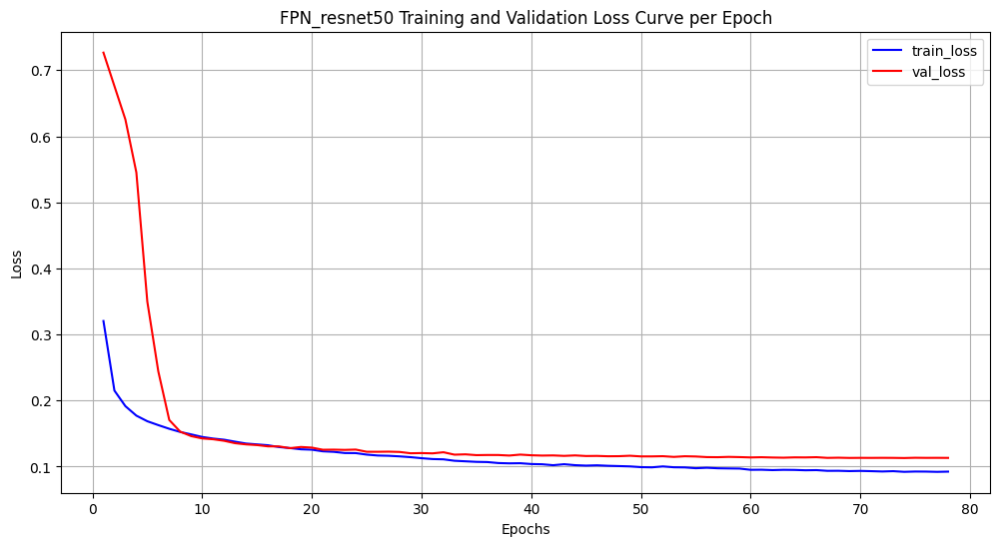

Best epoch:  73
Best Validation Loss:  0.1129


In [56]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

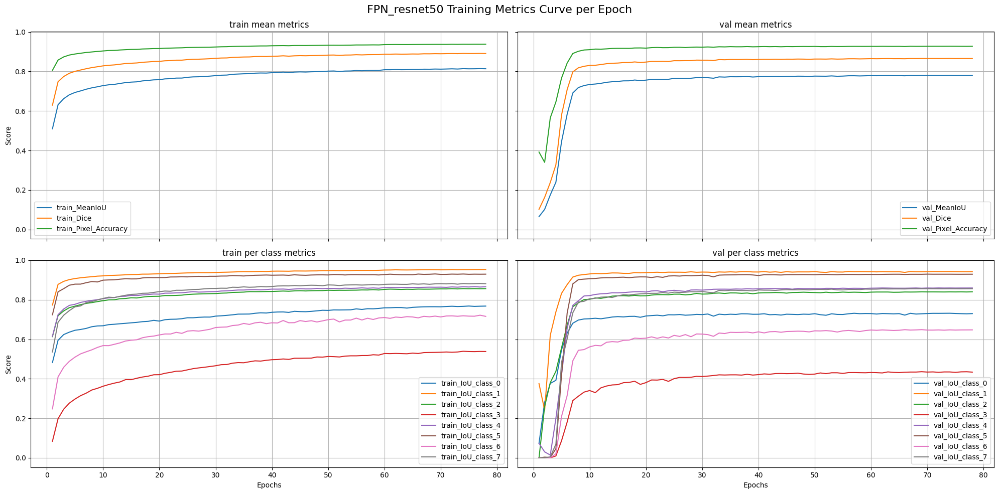

Best Validation MeanIoU:  0.7802
Best Validation Pixel Accuracy:  0.9277
Best Validation Dice:  0.8655


In [57]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

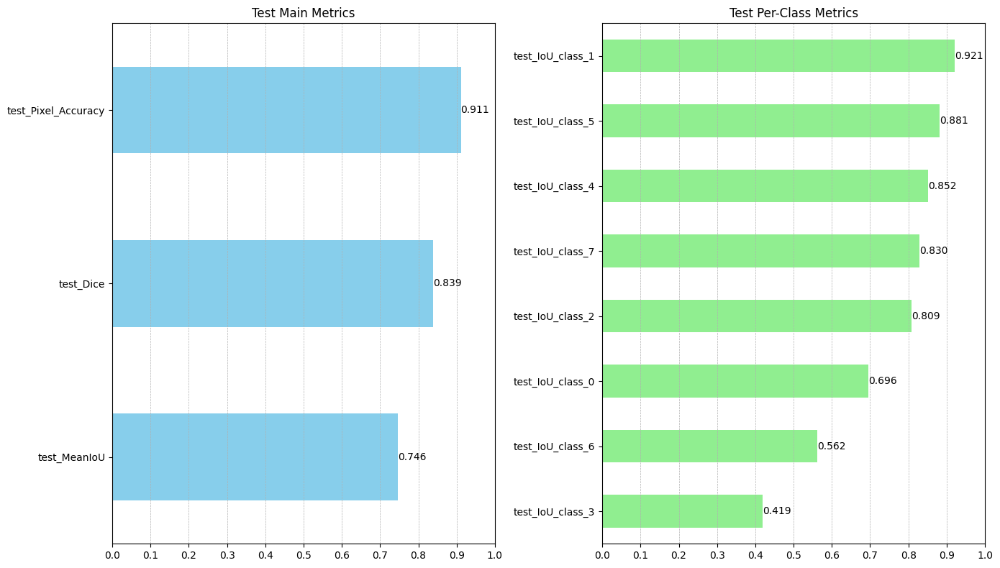

In [58]:
model_metric.plot_test_metrics()

1/1 [==============================] - 1s 729ms/step


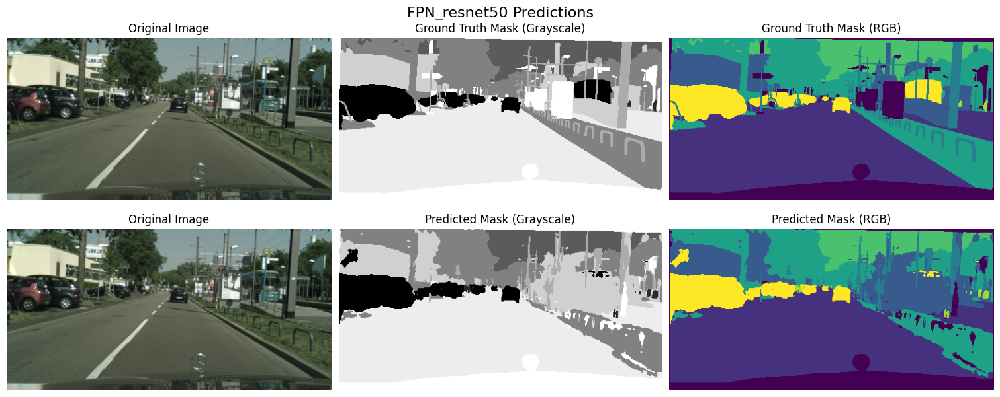

In [59]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [60]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 295ms/step


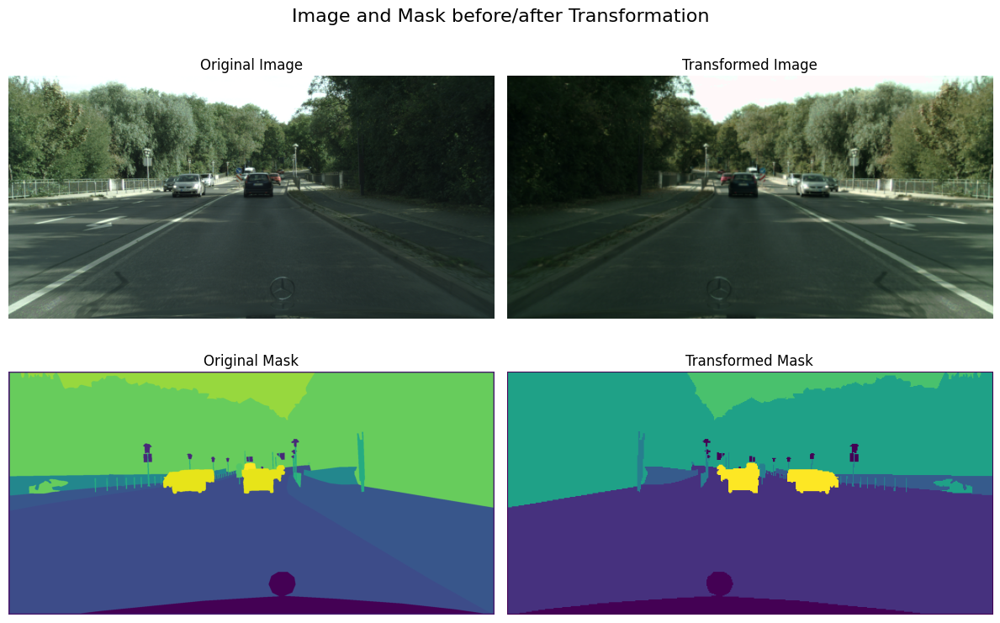

In [61]:
train_datagen.show_transformation(index=5)

### 64. Full Fine-Tuning

In [62]:
BACKBONE = "resnet50"
SEGMENTATION_MODEL = "FPN"

train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
    normalize=BACKBONE,
    label_onehot=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
    normalize=BACKBONE,
    label_onehot=True,
)

In [30]:
model = sm.FPN(
    BACKBONE,
    classes=train_datagen.num_classes,
    activation="softmax",
    encoder_weights="imagenet",
    input_shape=(256, 512, 3),
    encoder_freeze=True,
)

# Folder to create to store artifacts
new_folder = 64

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=6,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)

# Optimizer (AdamW not available in this version of TensorFlow)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Pretrain the model decoder for the 2 first epochs
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
)

# Pretrain the model decoder for the 2 first epochs
history_pretrain = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=3,
    workers=NUM_WORKERS,
)

for layer in model.layers:
    layer.trainable = True  # Ou False selon le besoin

# Recompiler
model.compile(
    optimizer=optimizer, loss=loss_fn, metrics=mean_metrics + per_class_metrics
)

# Train the full model for 50 epochs
history_train = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=65,
    workers=NUM_WORKERS,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)


Epoch 1/3


/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_5:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_4:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_1:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
/home/hedredo/github/oc_p8/.venv/lib/python3.10/site-packages/tensorflow/python/framework/indexed_slices.py:444: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("gradient_tape/dice_focal_loss/Reshape_7:0", shape=(8,), dtype=int32), values=Tensor("gradient_tape/dice_focal_loss/Reshape_6:0", shape=(8, None, 256, 512), dtype=float32), dense_shape=Tensor("gradient_tape/dice_focal_loss/Cast_2:0", shape=(4,), dtype=int32))) to a den

149/149 [==============================] - 3081s 21s/step - loss: 0.3239 - MeanIoU: 0.5076 - Dice: 0.6273 - Pixel_Accuracy: 0.7952 - IoU_class_0: 0.4680 - IoU_class_1: 0.7677 - IoU_class_2: 0.6156 - IoU_class_3: 0.0809 - IoU_class_4: 0.6028 - IoU_class_5: 0.7178 - IoU_class_6: 0.2600 - IoU_class_7: 0.5475 - val_loss: 0.6749 - val_MeanIoU: 0.1048 - val_Dice: 0.1600 - val_Pixel_Accuracy: 0.4113 - val_IoU_class_0: 0.2399 - val_IoU_class_1: 0.4241 - val_IoU_class_2: 3.4043e-04 - val_IoU_class_3: 3.0817e-10 - val_IoU_class_4: 0.1715 - val_IoU_class_5: 0.0028 - val_IoU_class_6: 5.4831e-10 - val_IoU_class_7: 7.7157e-11
Epoch 2/3
149/149 [==============================] - 3075s 21s/step - loss: 0.2145 - MeanIoU: 0.6326 - Dice: 0.7487 - Pixel_Accuracy: 0.8575 - IoU_class_0: 0.5962 - IoU_class_1: 0.8775 - IoU_class_2: 0.7201 - IoU_class_3: 0.1934 - IoU_class_4: 0.7226 - IoU_class_5: 0.8440 - IoU_class_6: 0.4162 - IoU_class_7: 0.6909 - val_loss: 0.6328 - val_MeanIoU: 0.1558 - val_Dice: 0.2251 - v

In [31]:
# Create a keras history object from the training history and pretrain history
history = combine_history(
    history_pretrain, history_train, f"{SEGMENTATION_MODEL}_{BACKBONE}"
)


In [32]:
# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights(f"../artifacts/{new_folder}/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

1/1 [==============================] - 1s 1s/step
Inference time on a unique prediction: 1.45 seconds


In [ ]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/64/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/64/best_model.keras",
        custom_objects={
            "DiceFocalLoss": DiceFocalLoss,
            "MeanIoU": sm.metrics.IOUScore,
            "Dice": sm.metrics.FScore,
            **{
                f"IoU_class_{i}": sm.metrics.IOUScore(class_indexes=i) for i in range(8)
            },
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.lr.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

Metrics file updated at ../metrics.csv
Pickle file created at ../artifacts


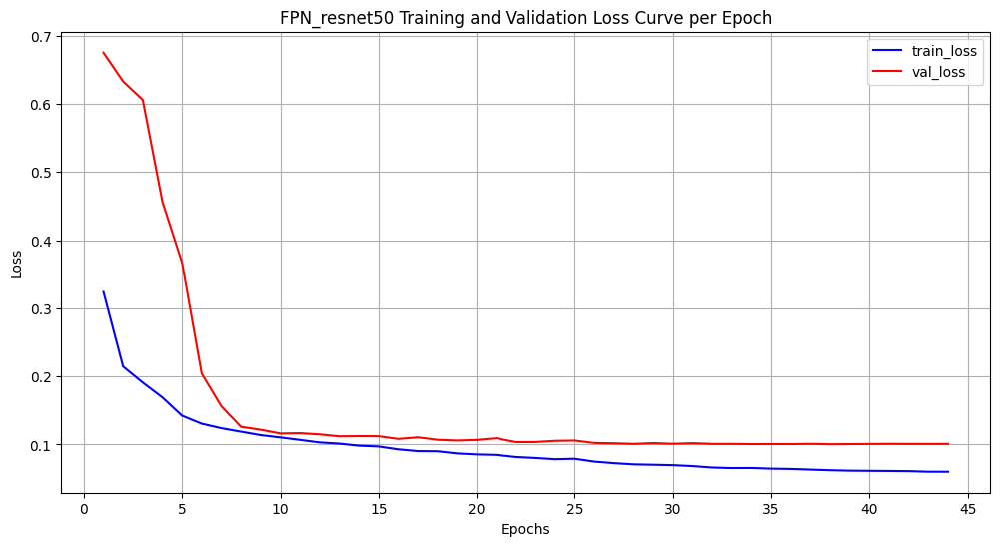

Best epoch:  37
Best Validation Loss:  0.1004


In [64]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

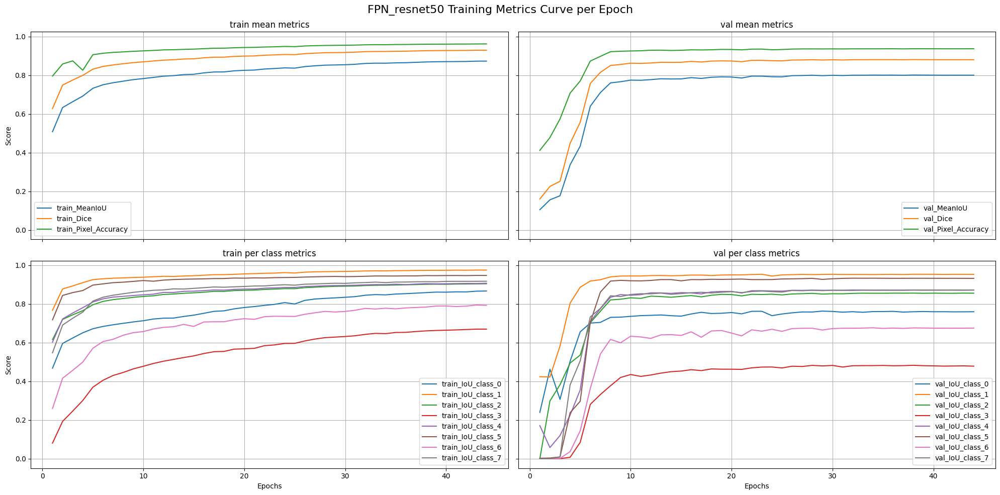

Best Validation MeanIoU:  0.8006
Best Validation Pixel Accuracy:  0.9363
Best Validation Dice:  0.8803


In [65]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

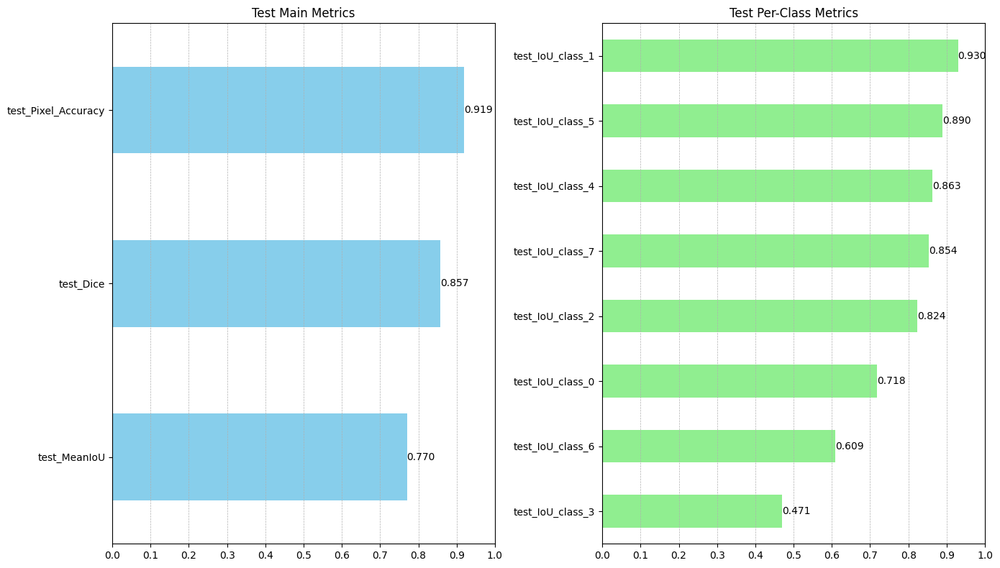

In [66]:
model_metric.plot_test_metrics()

1/1 [==============================] - 1s 737ms/step


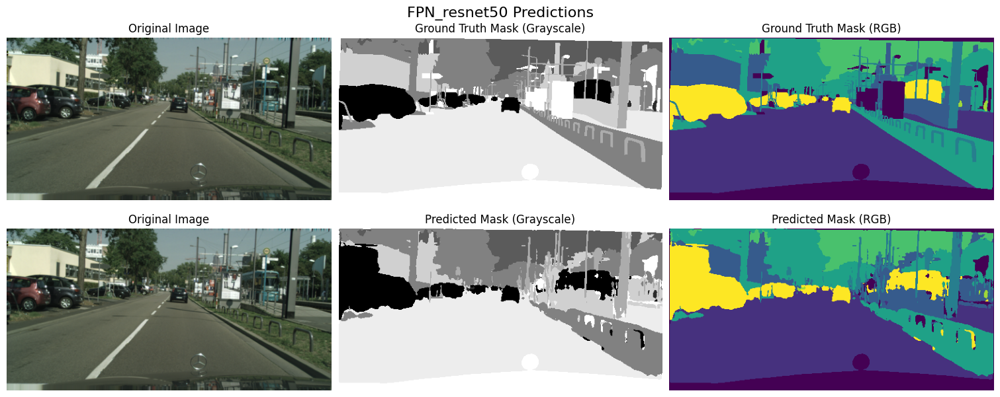

In [67]:
test_datagen.show_prediction(
    model=model, index=11, figname=f"{SEGMENTATION_MODEL}_{BACKBONE}"
)

In [68]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 [==============================] - 0s 279ms/step


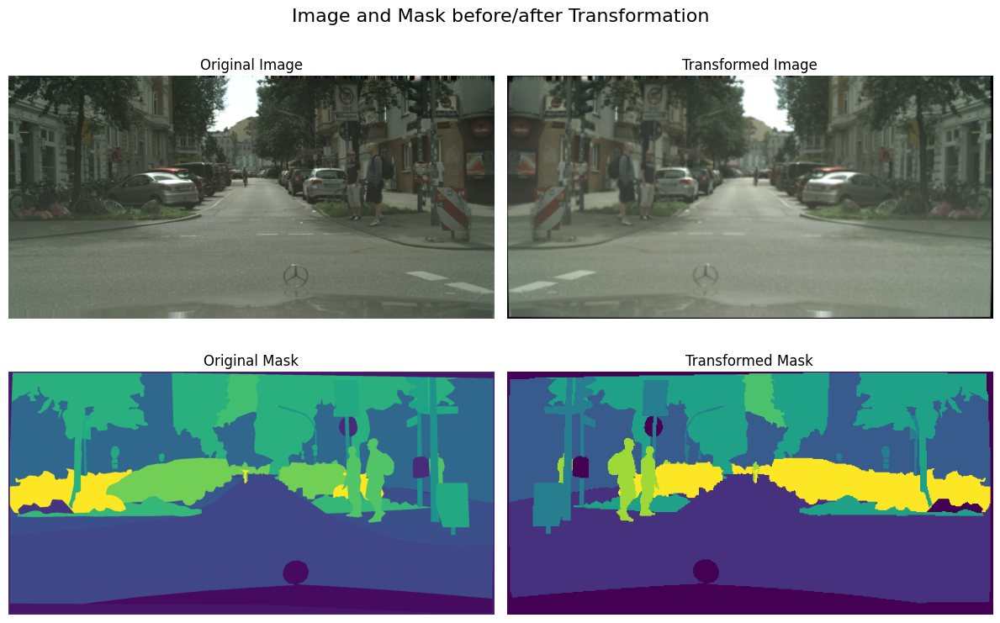

In [69]:
train_datagen.show_transformation(index=5)

# 7. Conclusion

In [327]:
import seaborn as sns
from utils_and_constants import labels

In [328]:
def abbreviate(string):
    split = string.split("_")
    split = [s.capitalize() for s in split]
    split = [s[0] for s in split if s[0].isupper()]
    return ".".join(split)

In [329]:
full_metric_df = pd.read_csv("../metrics.csv").drop_duplicates(
    keep="last", subset="experiment_folder"
)

In [330]:
experiments = [*range(50, 54)]
full_metric_df.loc[full_metric_df["experiment_folder"].isin(experiments), :]

,experiment_folder,train_Dice,train_IoU_class_0,train_IoU_class_1,train_IoU_class_2,train_IoU_class_3,train_IoU_class_4,train_IoU_class_5,train_IoU_class_6,train_IoU_class_7,...,classes,train_samples,val_samples,test_samples,train_batches,augmentations,normalize,loss_fn,optimizer,learning_rate
0,50,0.734631,0.708632,0.938496,0.839965,0.223216,0.854504,0.911107,0.491039,0.838667,...,8,2380,595,500,149,False,True,sparse_categorical_crossentropy,AdamW,0.0001
1,51,0.693780,0.621545,0.894529,0.723590,0.214494,0.794910,0.858830,0.411846,0.786141,...,8,2380,595,500,149,False,True,sparse_categorical_crossentropy_weighted,AdamW,0.0001
2,52,0.813875,0.705084,0.940452,0.845214,0.449888,0.865626,0.919305,0.657442,0.870339,...,8,2380,595,500,149,False,True,dice_crossentropy_loss,AdamW,0.0001
3,53,0.889000,0.899791,0.977902,0.916572,0.641387,0.915227,0.950981,0.780377,0.919968,...,8,2380,595,500,149,False,True,dice_focal_loss,AdamW,0.0001


In [331]:
full_metric_df.loc[full_metric_df["experiment_folder"].isin(experiments), :].filter(
    [c for c in full_metric_df.columns if "loss" in c and "test" not in c]
)

,train_loss,val_loss,loss_fn
0,0.236968,0.333953,sparse_categorical_crossentropy
1,0.015874,0.391617,sparse_categorical_crossentropy_weighted
2,0.230534,0.321189,dice_crossentropy_loss
3,0.135106,0.328383,dice_focal_loss


In [332]:
subset = full_metric_df.loc[
    full_metric_df["experiment_folder"].isin(experiments), :
].filter([c for c in full_metric_df.columns if "loss" in c] + ["best_epoch"])

subset.iloc[1, 0] = 0
subset

,train_loss,val_loss,test_loss,loss_fn,best_epoch
0,0.236968,0.333953,0.449008,sparse_categorical_crossentropy,24
1,0.000000,0.391617,0.480735,sparse_categorical_crossentropy_weighted,15
2,0.230534,0.321189,0.357508,dice_crossentropy_loss,25
3,0.135106,0.328383,0.380417,dice_focal_loss,43


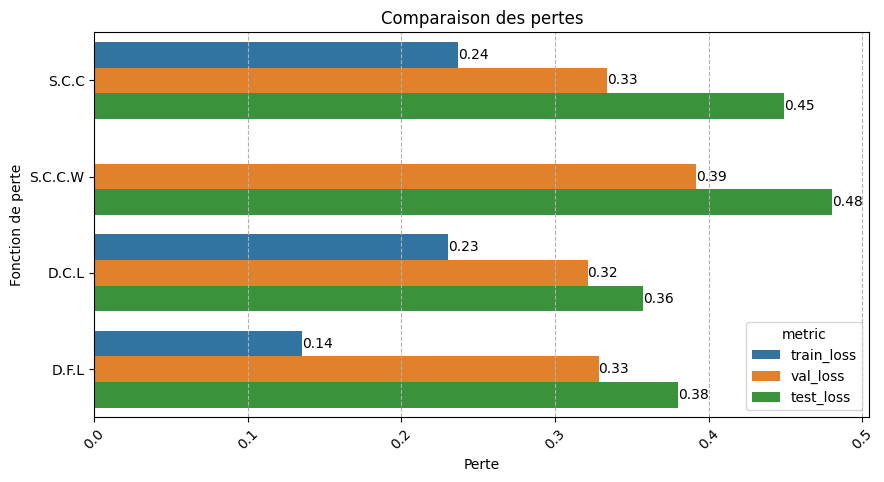

In [333]:
fig, ax = plt.subplots(figsize=(10, 5))
subset.melt(
    id_vars=["loss_fn", "best_epoch"],
    value_vars=["train_loss", "val_loss", "test_loss"],
    var_name="metric",
    value_name="loss",
).assign(
    **{
        "loss_fn": lambda x: x["loss_fn"].transform(lambda x: abbreviate(x)),
    }
).pipe(
    sns.barplot,
    y="loss_fn",
    x="loss",
    hue="metric",
    ax=ax,
).set(
    xlabel="Perte",
    ylabel="Fonction de perte",
    title="Comparaison des pertes",
)
show_nums_axes(orient="h", ax=ax, fmt=".2f")
plt.grid(visible=True, axis="x", linestyle="--")
plt.xticks(rotation=45)
plt.show()

In [334]:
subset = full_metric_df.loc[
    full_metric_df["experiment_folder"].isin(experiments), :
].filter(
    [c for c in full_metric_df.columns if "class" in c and "IoU" in c]
    + ["loss_fn", "best_epoch"]
)

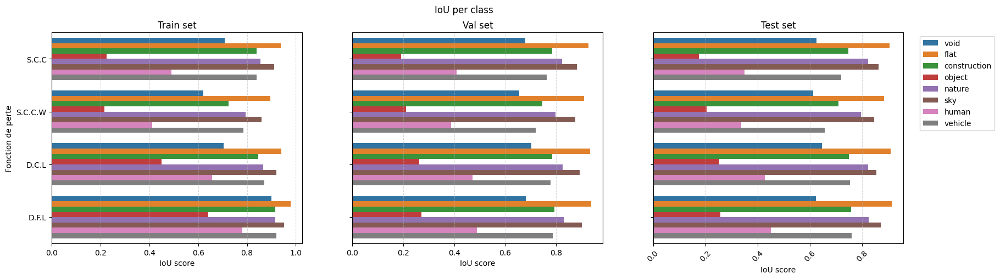

In [335]:
mapping = {label.categoryId: label.category for label in labels}

fig, ax = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
fig.suptitle("IoU per class")
for i, split in enumerate(("train", "val", "test")):
    (
        subset.melt(
            id_vars=["loss_fn", "best_epoch"],
            value_vars=[c for c in subset.columns if split in c],
            var_name="metric",
            value_name="IoU score",
        )
        .assign(
            **{
                "loss_fn": lambda x: x["loss_fn"].transform(lambda x: abbreviate(x)),
                "metric": lambda x: x["metric"]
                .str.strip(f"{split}_IoU_class_")
                .map(lambda x: mapping[int(x)]),
            }
        )
        .pipe(
            sns.barplot,
            y="loss_fn",
            x="IoU score",
            hue="metric",
            ax=ax[i],
            legend=False if i < 2 else True,
            # set the legend outside the plot
        )
    )
    ax[i].set_title(f"{split.capitalize()} set")
    plt.xticks(rotation=45)
    # get the grid lines on x axis
    ax[i].xaxis.grid(visible=True, linestyle="--", alpha=0.5)
    ax[i].set_ylabel("Fonction de perte")
    if i == 2:
        ax[i].legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)
plt.show()

In [336]:
subset = full_metric_df.loc[
    full_metric_df["experiment_folder"].isin(experiments), :
].filter(
    [c for c in full_metric_df.columns if "class" not in c and "loss" not in c]
    + ["loss_fn", "best_epoch"]
)

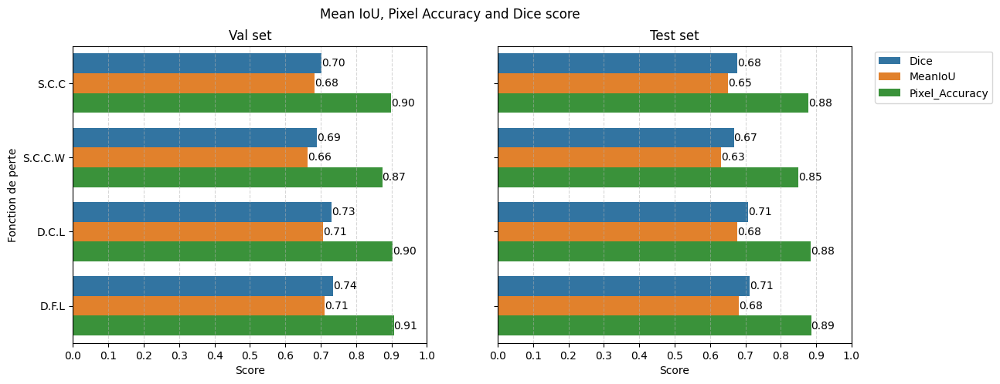

In [337]:
fig, ax = plt.subplots(1, 2, figsize=(13, 5), sharey=True)
fig.suptitle("Mean IoU, Pixel Accuracy and Dice score")
for i, split in enumerate(("val", "test")):
    melted = (
        subset.melt(
            id_vars=["loss_fn", "best_epoch"],
            value_vars=[c for c in subset.columns if split in c and "samples" not in c],
            var_name="metric",
            value_name="Score",
        )
        .assign(
            **{
                "loss_fn": lambda x: x["loss_fn"].transform(lambda x: abbreviate(x)),
            }
        )
        .pipe(
            sns.barplot,
            y="loss_fn",
            x="Score",
            hue="metric",
            ax=ax[i],
            legend=False if i < 1 else True,
        )
        .set(
            title=f"{split.capitalize()} set",
            ylabel="Fonction de perte",
        )
    )
    # Set the x axis ticks to in ntervals of 0.1
    ax[i].set_xticks(np.arange(0, 1.1, 0.1))
    # get the grid lines on x axis
    ax[i].xaxis.grid(visible=True, linestyle="--", alpha=0.5)
    show_nums_axes(orient="h", ax=ax[i], fmt=".2f")
    if i == 1:
        ax[i].legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)
        # Strip the legend labels with "test_"
        for text in ax[i].legend_.texts:
            text.set_text(text.get_text().replace("test_", ""))
plt.show()

In [349]:
experiments = [*range(53, 55)]
full_metric_df.loc[full_metric_df["experiment_folder"].isin(experiments), :]

,experiment_folder,train_Dice,train_IoU_class_0,train_IoU_class_1,train_IoU_class_2,train_IoU_class_3,train_IoU_class_4,train_IoU_class_5,train_IoU_class_6,train_IoU_class_7,...,classes,train_samples,val_samples,test_samples,train_batches,augmentations,normalize,loss_fn,optimizer,learning_rate
3,53,0.889000,0.899791,0.977902,0.916572,0.641387,0.915227,0.950981,0.780377,0.919968,...,8,2380,595,500,149,False,True,dice_focal_loss,AdamW,0.00010
7,54,0.851266,0.823411,0.963337,0.876764,0.544061,0.879622,0.932785,0.709427,0.889942,...,8,2380,595,500,149,True,True,dice_focal_loss,AdamW,0.00005


In [350]:
subset = full_metric_df.loc[
    full_metric_df["experiment_folder"].isin(experiments), :
].filter(
    [c for c in full_metric_df.columns if "loss" in c]
    + ["best_epoch"]
    + ["augmentations"]
)
subset

,train_loss,val_loss,test_loss,loss_fn,best_epoch,augmentations
3,0.135106,0.328383,0.380417,dice_focal_loss,43,False
7,0.179085,0.285972,0.325627,dice_focal_loss,49,True


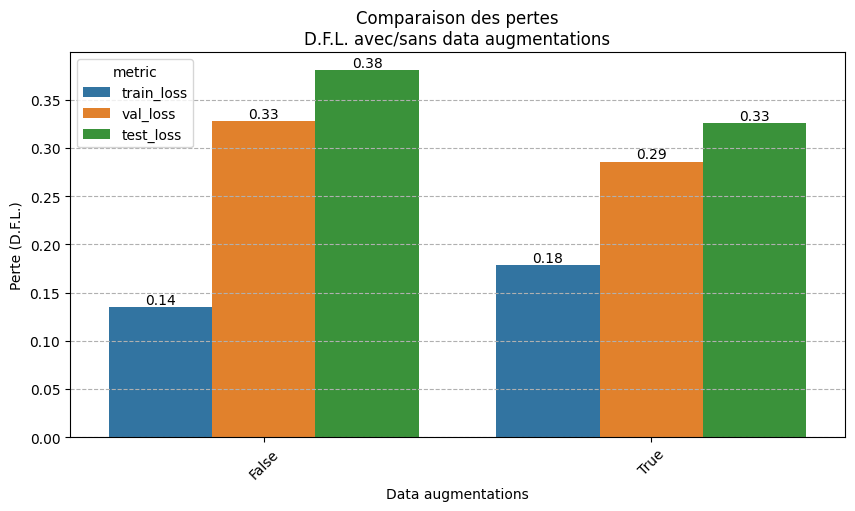

In [351]:
fig, ax = plt.subplots(figsize=(10, 5))
subset.melt(
    id_vars=["augmentations", "best_epoch"],
    value_vars=["train_loss", "val_loss", "test_loss"],
    var_name="metric",
    value_name="loss",
).pipe(
    sns.barplot,
    x="augmentations",
    y="loss",
    hue="metric",
    ax=ax,
).set(
    xlabel="Data augmentations",
    ylabel="Perte (D.F.L.)",
    title="Comparaison des pertes\nD.F.L. avec/sans data augmentations",
)
show_nums_axes(orient="v", ax=ax, fmt=".2f")
plt.grid(visible=True, axis="y", linestyle="--")
plt.xticks(rotation=45)
plt.show()

In [352]:
subset = full_metric_df.loc[
    full_metric_df["experiment_folder"].isin(experiments), :
].filter(
    [c for c in full_metric_df.columns if "class" in c and "IoU" in c]
    + ["best_epoch"]
    + ["augmentations"]
)

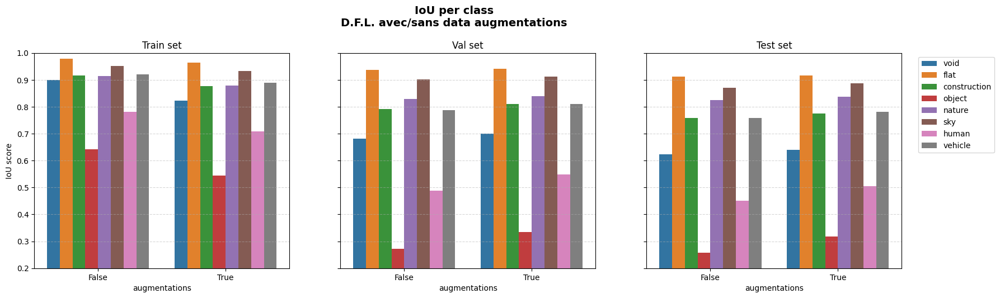

In [354]:
mapping = {label.categoryId: label.category for label in labels}

fig, ax = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
fig.suptitle(
    "IoU per class\nD.F.L. avec/sans data augmentations",
    fontsize=14,
    fontweight="bold",
    y=1.05,
)
for i, split in enumerate(("train", "val", "test")):
    (
        subset.melt(
            id_vars=["augmentations", "best_epoch"],
            value_vars=[c for c in subset.columns if split in c],
            var_name="metric",
            value_name="IoU score",
        )
        .assign(
            **{
                "metric": lambda x: x["metric"]
                .str.strip(f"{split}_IoU_class_")
                .map(lambda x: mapping[int(x)]),
            }
        )
        .pipe(
            sns.barplot,
            x="augmentations",
            y="IoU score",
            hue="metric",
            ax=ax[i],
            legend=False if i < 2 else True,
            # set the legend outside the plot
        )
    )
    ax[i].set_title(f"{split.capitalize()} set")
    ax[i].set_yticks(np.arange(0, 1.1, 0.1))
    # get the grid lines on x axis
    ax[i].yaxis.grid(visible=True, linestyle="--", alpha=0.5)
    ax[i].set_ylabel("IoU score")
    ax[i].set_ylim(0.2, 1)
    if i == 2:
        ax[i].legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)
plt.show()

In [343]:
subset = full_metric_df.loc[
    full_metric_df["experiment_folder"].isin(experiments), :
].filter(
    [c for c in full_metric_df.columns if "class" not in c and "loss" not in c]
    + ["best_epoch"]
    + ["augmentations"]
)


In [344]:
subset

,experiment_folder,train_Dice,train_MeanIoU,train_Pixel_Accuracy,val_Dice,val_MeanIoU,val_Pixel_Accuracy,test_Dice,test_MeanIoU,test_Pixel_Accuracy,...,model_name,inference_time,train_samples,val_samples,test_samples,train_batches,augmentations,normalize,optimizer,learning_rate
3,53,0.889000,0.875276,0.964867,0.735212,0.711210,0.906467,0.711730,0.681840,0.885684,...,u-net,0.770081,2380,595,500,149,False,True,AdamW,0.00010
7,54,0.851266,0.827419,0.946353,0.758250,0.736962,0.914420,0.736273,0.707789,0.894753,...,u-net,0.691324,2380,595,500,149,True,True,AdamW,0.00005


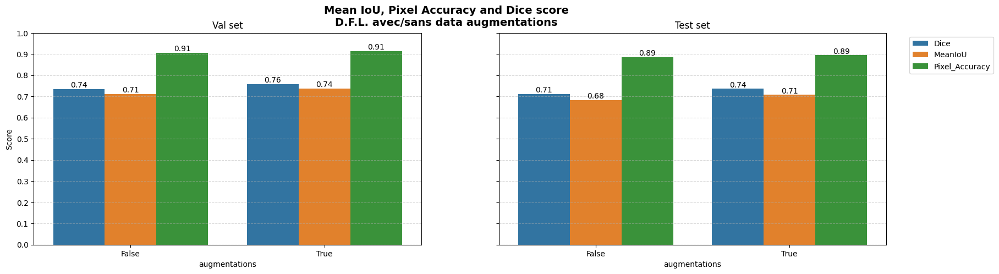

In [345]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5), sharey=True)
fig.suptitle(
    "Mean IoU, Pixel Accuracy and Dice score\nD.F.L. avec/sans data augmentations",
    fontsize=14,
    fontweight="bold",
)
for i, split in enumerate(("val", "test")):
    melted = (
        subset.melt(
            id_vars=["augmentations", "best_epoch"],
            value_vars=[c for c in subset.columns if split in c and "samples" not in c],
            var_name="metric",
            value_name="Score",
        )
        .pipe(
            sns.barplot,
            x="augmentations",
            y="Score",
            hue="metric",
            ax=ax[i],
            legend=False if i < 1 else True,
        )
        .set(
            title=f"{split.capitalize()} set",
            ylabel="Score",
        )
    )
    # Set the x axis ticks to in ntervals of 0.1
    ax[i].set_yticks(np.arange(0, 1.1, 0.1))
    # get the grid lines on x axis
    ax[i].yaxis.grid(visible=True, linestyle="--", alpha=0.5)
    show_nums_axes(orient="v", ax=ax[i], fmt=".2f")
    if i == 1:
        ax[i].legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=10)
        # Strip the legend labels with "test_"
        for text in ax[i].legend_.texts:
            text.set_text(text.get_text().replace("test_", ""))
plt.show()

In [415]:
tags = {
    60: "Transfer learning",
    605: "Partial Fine-Tuning",
    61: "Full Fine-Tuning",
    615: "Transfer learning",
    62: "Partial Fine-Tuning",
    625: "Full Fine-Tuning",
    63: "Transfer learning",
    64: "Full Fine-Tuning",
}

In [416]:
subset = (
    full_metric_df.loc[full_metric_df["experiment_folder"] >= 60, :]
    .assign(
        **{
            "strategy": lambda x: x["experiment_folder"].map(tags),
        }
    )
    .filter(
        [c for c in full_metric_df.columns if "loss" in c]
        + ["best_epoch", "model_name", "strategy"]
    )
    .assign(
        **{
            "model_name": lambda x: x["model_name"].str.split("_"),
        }
    )
    .assign(
        **{
            "segmentation_model": lambda x: x["model_name"].transform(
                lambda x: x.str[0]
            ),
            "backbone": lambda x: x["model_name"].transform(lambda x: x.str[1]),
        }
    )
)

In [417]:
subset

,train_loss,val_loss,test_loss,loss_fn,best_epoch,model_name,strategy,segmentation_model,backbone
12,0.092161,0.114388,0.135771,dice_focal_loss,40,"[u-net, resnet50]",Transfer learning,u-net,resnet50
13,0.074358,0.108803,0.129839,dice_focal_loss,37,"[u-net, resnet50]",Partial Fine-Tuning,u-net,resnet50
14,0.070750,0.103066,0.122437,dice_focal_loss,39,"[u-net, resnet50]",Full Fine-Tuning,u-net,resnet50
15,0.097927,0.113493,0.133677,dice_focal_loss,49,"[u-net, efficientnetb3]",Transfer learning,u-net,efficientnetb3
16,0.122474,0.130471,0.151589,dice_focal_loss,15,"[u-net, efficientnetb3]",Full Fine-Tuning,u-net,efficientnetb3
17,0.091991,0.112889,0.134220,dice_focal_loss,73,"[FPN, resnet50]",Transfer learning,FPN,resnet50
18,0.062318,0.100423,0.119499,dice_focal_loss,37,"[FPN, resnet50]",Full Fine-Tuning,FPN,resnet50
19,0.076842,0.105413,0.126195,dice_focal_loss,49,"[u-net, efficientnetb3]",Partial Fine-Tuning,u-net,efficientnetb3


In [418]:
def show_nums_facet(g, orient="v", decimals=0):
    """
    Affiche les valeurs numériques sur les barres d'un graphique à facettes (FacetGrid).

    Args:
        g (seaborn.axisgrid.FacetGrid): L'objet FacetGrid.
        orient (str, optional): L'orientation des barres. 'v' pour vertical (par défaut), 'h' pour horizontal.

    Returns:
        None
    """
    # Error management
    if orient not in ["h", "v"]:
        raise ValueError("orient doit être égal à 'h' ou 'v si spécifié")
    if (decimals < 0) | (not isinstance(decimals, int)):
        raise ValueError("decimals should be a integer and >=0")
    if orient == "v":
        for ax in g.axes.flat:
            for p in ax.patches:
                if not np.isnan(p.get_height()):
                    ax.annotate(
                        f"{p.get_height():.{decimals}f}"
                        if p.get_height() != 0
                        else f"",
                        (p.get_x() + p.get_width() / 2.0, p.get_height()),
                        ha="center",
                        va="bottom",
                    )
    elif orient == "h":
        for ax in g.axes.flat:
            for p in ax.patches:
                if not np.isnan(p.get_width()):
                    ax.annotate(
                        f"{p.get_width():.{decimals}f}" if p.get_width() != 0 else f"",
                        (p.get_width(), p.get_y() + p.get_height() / 2.0),
                        ha="left",
                        va="center",
                    )


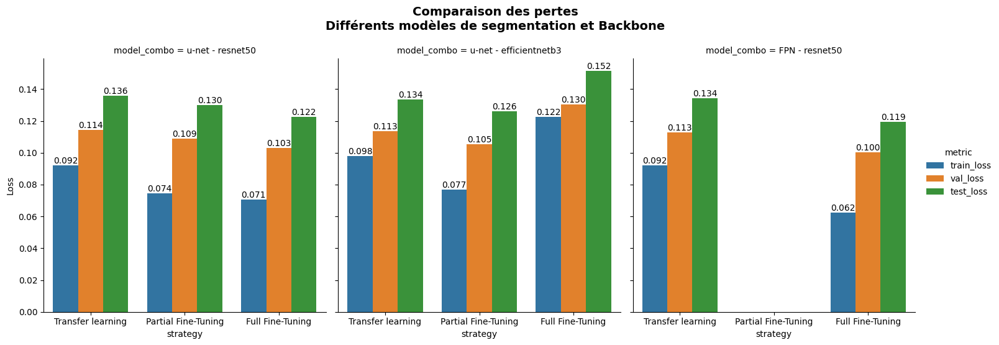

In [419]:
# Create a new column for the combined facet
subset["model_combo"] = subset["segmentation_model"] + " - " + subset["backbone"]

g = (
    subset.melt(
        id_vars=["model_combo", "best_epoch", "strategy"],
        value_vars=["train_loss", "val_loss", "test_loss"],
        var_name="metric",
        value_name="loss",
    )
    .pipe(
        sns.catplot,
        x="strategy",
        y="loss",
        hue="metric",
        col="model_combo",
        row=None,  # Remove grouping by row so that all plots are on a single row
        kind="bar",
        height=5,
        aspect=1,
        errorbar=None,
        col_wrap=len(
            subset["model_combo"].unique()
        ),  # Ensure all facets appear in one row
    )
    .set(ylabel="Loss")
)

g.fig.suptitle(
    "Comparaison des pertes\nDifférents modèles de segmentation et Backbone",
    fontsize=14,
    fontweight="bold",
    y=1.1,
)

show_nums_facet(g, orient="v", decimals=3)
plt.show()

In [441]:
subset = (
    full_metric_df.loc[full_metric_df["experiment_folder"] >= 60, :]
    .assign(
        **{
            "strategy": lambda x: x["experiment_folder"].map(tags),
        }
    )
    .filter(
        [
            c
            for c in full_metric_df.columns
            if "class" not in c and "test" in c and "loss" not in c
        ]
        + ["best_epoch", "model_name", "strategy"]
    )
    .assign(
        **{
            "model_name": lambda x: x["model_name"].str.split("_"),
        }
    )
    .assign(
        **{
            "segmentation_model": lambda x: x["model_name"].transform(
                lambda x: x.str[0]
            ),
            "backbone": lambda x: x["model_name"].transform(lambda x: x.str[1]),
        }
    )
)

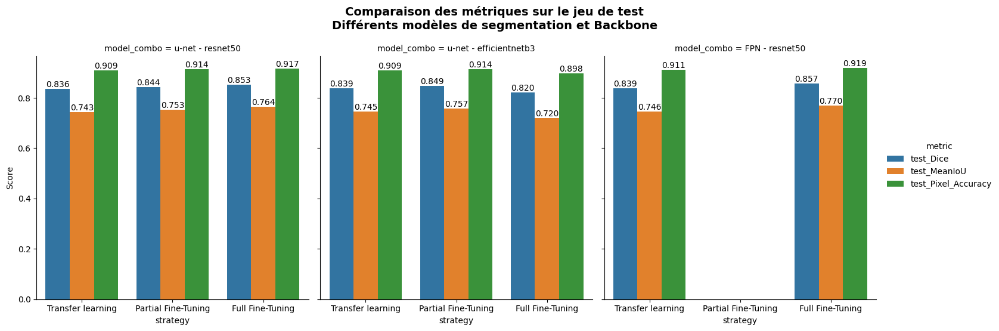

In [442]:
# Create a new column for the combined facet
subset["model_combo"] = subset["segmentation_model"] + " - " + subset["backbone"]

g = (
    subset.melt(
        id_vars=["model_combo", "best_epoch", "strategy"],
        value_vars=[
            c
            for c in subset.columns
            if ("IoU" in c or "Dice" in c or "Pixel" in c) and "samples" not in c
        ],
        var_name="metric",
        value_name="loss",
    )
    .pipe(
        sns.catplot,
        x="strategy",
        y="loss",
        hue="metric",
        col="model_combo",
        row=None,  # Remove grouping by row so that all plots are on a single row
        kind="bar",
        height=5,
        aspect=1,
        errorbar=None,
        col_wrap=len(
            subset["model_combo"].unique()
        ),  # Ensure all facets appear in one row
    )
    .set(ylabel="Score")
)

g.fig.suptitle(
    "Comparaison des métriques sur le jeu de test\nDifférents modèles de segmentation et Backbone",
    fontsize=14,
    fontweight="bold",
    y=1.1,
)

show_nums_facet(g, orient="v", decimals=3)
plt.show()

In [433]:
weight_tags = {
    "u-net": 31_032_200,
    "u-net_efficientnetb3": 7170632 + 10698216,
    "u-net_resnet50": 9059659 + 23502470,
    "FPN_resnet50": 3417099 + 23502790,
    "FPN_efficientnetb3": 3221256 + 10698536,
}

In [434]:
subset = full_metric_df.sort_values(by="inference_time", ascending=False).assign(
    **{
        "weights": lambda x: x["model_name"].map(weight_tags),
    }
)

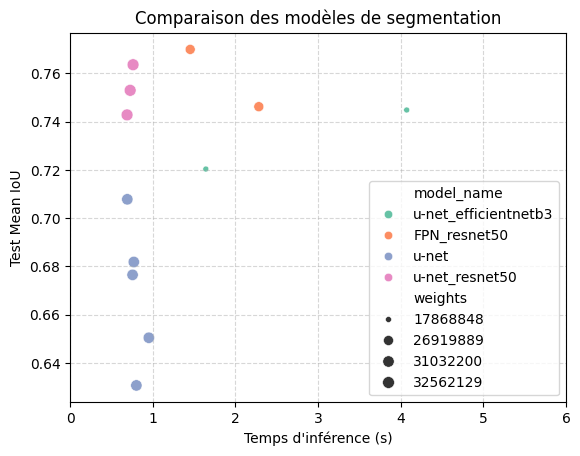

In [439]:
sns.scatterplot(
    data=subset,
    x="inference_time",
    y="test_MeanIoU",
    hue="model_name",
    size="weights",
    palette="Set2",
).set(
    title="Comparaison des modèles de segmentation",
    xlabel="Temps d'inférence (s)",
    ylabel="Test Mean IoU",
    xlim=(0, 6),
)
plt.grid(visible=True, linestyle="--", alpha=0.5)
plt.show()